In [1]:
#Install all the packages
from __future__ import print_function
import pandas as pd
import numpy as np
from html.parser import HTMLParser
html_parser = HTMLParser()
from textblob import TextBlob
import nltk
nltk.download('wordnet')
from nltk.stem.wordnet import WordNetLemmatizer
from os import path
import matplotlib.pyplot as plt
from os import path
from wordcloud import WordCloud
import preprocessor as p
import logging
import pickle
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)


[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/jennifer/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:
%pylab inline
import numpy 
import matplotlib.pyplot as plt
import sklearn
# Import all of the scikit learn stuff
from __future__ import print_function
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer 
from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.preprocessing import Normalizer
from sklearn import metrics
from sklearn.cluster import KMeans, MiniBatchKMeans
import pandas as pd

Populating the interactive namespace from numpy and matplotlib


In [29]:
pd.set_option('display.height', None)
pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', 500)
pd.set_option('display.width', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)

height has been deprecated.



####  Configure Twitter Account

In [76]:
import requests
from requests_oauthlib import OAuth1

In [77]:
#Importing config file
import cnfg
config = cnfg.load(".twitter_config")

oauth = OAuth1(config["consumer_key"],
               config["consumer_secret"],
               config["access_token"],
               config["access_token_secret"])

In [249]:
response = requests.get("https://api.twitter.com/1.1/statuses/user_timeline.json",
                        auth=oauth)

tweets = response.json()
#tweets is a dictionary that has the following keys
for key in tweets[0].keys():
    print(key)
    

created_at
id
id_str
text
truncated
entities
source
in_reply_to_status_id
in_reply_to_status_id_str
in_reply_to_user_id
in_reply_to_user_id_str
in_reply_to_screen_name
user
geo
coordinates
place
contributors
is_quote_status
retweet_count
favorite_count
favorited
retweeted
lang


In [250]:
tweets[0]

{'contributors': None,
 'coordinates': None,
 'created_at': 'Thu Feb 22 18:45:23 +0000 2018',
 'entities': {'hashtags': [], 'symbols': [], 'urls': [], 'user_mentions': []},
 'favorite_count': 0,
 'favorited': False,
 'geo': None,
 'id': 966745754936082432,
 'id_str': '966745754936082432',
 'in_reply_to_screen_name': None,
 'in_reply_to_status_id': None,
 'in_reply_to_status_id_str': None,
 'in_reply_to_user_id': None,
 'in_reply_to_user_id_str': None,
 'is_quote_status': False,
 'lang': 'en',
 'place': None,
 'retweet_count': 0,
 'retweeted': False,
 'source': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
 'text': 'test',
 'truncated': False,
 'user': {'contributors_enabled': False,
  'created_at': 'Sat Dec 23 01:13:29 +0000 2017',
  'default_profile': True,
  'default_profile_image': True,
  'description': '',
  'entities': {'description': {'urls': []}},
  'favourites_count': 0,
  'follow_request_sent': False,
  'followers_count': 0,
  'following': False,
  'fr

In [113]:
#Check what tweets have been sent
for tweet in tweets:
    print(tweet['text'])

test


### Read in tweets from Tweepy

In [78]:
# !pip install tweepy
import tweepy


In [79]:
auth = tweepy.OAuthHandler(config["consumer_key"],
                           config["consumer_secret"])
auth.set_access_token(config["access_token"],
                      config["access_token_secret"])

# api=tweepy.API(auth)
api = tweepy.API(auth,wait_on_rate_limit=True, wait_on_rate_limit_notify=True)

In [405]:
import json
max_tweets=30000
query ="[gun,guns]"
results=[]



In [406]:
#Specify dates from which to collect data
for tweet in tweepy.Cursor(api.search,q=query,since="2018-02-14",until="2018-02-23",lang="en",tweet_mode="extended").items(max_tweets):
    results.append(tweet)



2018-03-01 15:26:19,670 : INFO : PARAMS: {'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:19,944 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:19,948 : INFO : PARAMS: {'max_id': b'966824904556535809', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:20,103 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:20,108 : INFO : PARAMS: {'max_id': b'966824892732788736', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:20,295 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:20,301 : INFO : PARAMS: {'max_id': b'966824870473498623', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:20,496 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:20,502 : INFO : PARAMS: {'max_id

2018-03-01 15:26:26,627 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:26,632 : INFO : PARAMS: {'max_id': b'966824432269451264', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:26,794 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:26,798 : INFO : PARAMS: {'max_id': b'966824411562237951', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:26,992 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:26,996 : INFO : PARAMS: {'max_id': b'966824392239079423', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:27,234 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:27,240 : INFO : PARAMS: {'max_id': b'966824383816839167', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26

2018-03-01 15:26:33,063 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:33,068 : INFO : PARAMS: {'max_id': b'966823944383877119', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:33,218 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:33,223 : INFO : PARAMS: {'max_id': b'966823937232351232', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:33,359 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:33,364 : INFO : PARAMS: {'max_id': b'966823923336785920', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:33,613 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:33,618 : INFO : PARAMS: {'max_id': b'966823906618245119', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26

2018-03-01 15:26:39,431 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:39,436 : INFO : PARAMS: {'max_id': b'966823439729352703', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:39,733 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:39,738 : INFO : PARAMS: {'max_id': b'966823427288936447', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:39,921 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:39,926 : INFO : PARAMS: {'max_id': b'966823415884795905', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:40,096 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:40,101 : INFO : PARAMS: {'max_id': b'966823407361970175', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26

2018-03-01 15:26:46,937 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:46,942 : INFO : PARAMS: {'max_id': b'966822932524740608', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:47,084 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:47,089 : INFO : PARAMS: {'max_id': b'966822919430131712', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:47,226 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:47,234 : INFO : PARAMS: {'max_id': b'966822905299587071', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:47,393 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:47,398 : INFO : PARAMS: {'max_id': b'966822892880220159', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26

2018-03-01 15:26:54,658 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:54,663 : INFO : PARAMS: {'max_id': b'966822362111934463', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:54,845 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:54,850 : INFO : PARAMS: {'max_id': b'966822345586368511', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:55,080 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:55,086 : INFO : PARAMS: {'max_id': b'966822320705802245', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26:55,301 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:26:55,306 : INFO : PARAMS: {'max_id': b'966822306008809471', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:26

Rate limit reached. Sleeping for: 773


2018-03-01 15:39:54,467 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:39:54,471 : INFO : PARAMS: {'max_id': b'966822220231335935', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:39:54,720 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:39:54,725 : INFO : PARAMS: {'max_id': b'966822208030101505', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:39:54,939 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:39:54,943 : INFO : PARAMS: {'max_id': b'966822198722859007', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:39:55,144 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:39:55,149 : INFO : PARAMS: {'max_id': b'966822178724466688', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:39

2018-03-01 15:40:02,621 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:02,627 : INFO : PARAMS: {'max_id': b'966821643195748351', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:02,882 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:02,886 : INFO : PARAMS: {'max_id': b'966821627320197119', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:03,030 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:03,034 : INFO : PARAMS: {'max_id': b'966821609528086530', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:03,206 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:03,210 : INFO : PARAMS: {'max_id': b'966821595636555775', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40

2018-03-01 15:40:09,198 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:09,202 : INFO : PARAMS: {'max_id': b'966821114201759744', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:09,373 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:09,378 : INFO : PARAMS: {'max_id': b'966821097944600576', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:09,554 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:09,558 : INFO : PARAMS: {'max_id': b'966821082874380287', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:09,717 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:09,723 : INFO : PARAMS: {'max_id': b'966821065832923138', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40

2018-03-01 15:40:16,778 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:16,785 : INFO : PARAMS: {'max_id': b'966820574654881791', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:16,932 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:16,937 : INFO : PARAMS: {'max_id': b'966820559353937919', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:17,112 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:17,116 : INFO : PARAMS: {'max_id': b'966820542736162816', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:17,286 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:17,290 : INFO : PARAMS: {'max_id': b'966820525191266303', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40

2018-03-01 15:40:23,787 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:23,792 : INFO : PARAMS: {'max_id': b'966819996281253887', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:23,996 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:24,008 : INFO : PARAMS: {'max_id': b'966819971195113474', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:24,453 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:24,462 : INFO : PARAMS: {'max_id': b'966819958951960575', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:24,670 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:24,696 : INFO : PARAMS: {'max_id': b'966819940253790207', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40

2018-03-01 15:40:30,521 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:30,525 : INFO : PARAMS: {'max_id': b'966819435955740671', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:30,742 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:30,746 : INFO : PARAMS: {'max_id': b'966819427072335871', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:31,047 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:31,051 : INFO : PARAMS: {'max_id': b'966819409175212031', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40:31,248 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:40:31,253 : INFO : PARAMS: {'max_id': b'966819393807241215', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:40

Rate limit reached. Sleeping for: 862


2018-03-01 15:54:59,775 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:54:59,781 : INFO : PARAMS: {'max_id': b'966819286550548479', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:54:59,963 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:54:59,968 : INFO : PARAMS: {'max_id': b'966819271010594815', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:00,134 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:00,139 : INFO : PARAMS: {'max_id': b'966819262072418304', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:00,308 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:00,314 : INFO : PARAMS: {'max_id': b'966819250261430273', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55

2018-03-01 15:55:07,186 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:07,191 : INFO : PARAMS: {'max_id': b'966818744533053439', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:07,394 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:07,399 : INFO : PARAMS: {'max_id': b'966818723783884799', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:07,543 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:07,548 : INFO : PARAMS: {'max_id': b'966818708327927808', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:07,725 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:07,732 : INFO : PARAMS: {'max_id': b'966818692745981951', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55

2018-03-01 15:55:13,739 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:13,752 : INFO : PARAMS: {'max_id': b'966818163173212159', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:13,895 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:13,899 : INFO : PARAMS: {'max_id': b'966818149088849924', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:14,075 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:14,079 : INFO : PARAMS: {'max_id': b'966818129295921151', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:14,234 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:14,241 : INFO : PARAMS: {'max_id': b'966818102716506111', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55

2018-03-01 15:55:22,968 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:22,974 : INFO : PARAMS: {'max_id': b'966817593993650175', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:23,126 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:23,131 : INFO : PARAMS: {'max_id': b'966817579875651583', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:23,324 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:23,330 : INFO : PARAMS: {'max_id': b'966817566961356801', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:23,503 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:23,508 : INFO : PARAMS: {'max_id': b'966817555133247487', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55

2018-03-01 15:55:28,801 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:28,807 : INFO : PARAMS: {'max_id': b'966817050990727167', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:28,954 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:28,958 : INFO : PARAMS: {'max_id': b'966817031743070207', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:29,126 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:29,132 : INFO : PARAMS: {'max_id': b'966817012818305023', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:29,302 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:29,307 : INFO : PARAMS: {'max_id': b'966816995403472895', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55

2018-03-01 15:55:35,299 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:35,303 : INFO : PARAMS: {'max_id': b'966816503956955140', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:35,478 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:35,484 : INFO : PARAMS: {'max_id': b'966816487137796101', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:35,691 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:35,694 : INFO : PARAMS: {'max_id': b'966816471686045695', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55:36,004 : INFO : PARAMS: {'create': b'True'}
2018-03-01 15:55:36,008 : INFO : PARAMS: {'max_id': b'966816462240350208', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 15:55

Rate limit reached. Sleeping for: 862


2018-03-01 16:10:04,475 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:04,481 : INFO : PARAMS: {'max_id': b'966816357693181953', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:04,664 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:04,669 : INFO : PARAMS: {'max_id': b'966816340395937791', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:04,851 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:04,857 : INFO : PARAMS: {'max_id': b'966816321227907071', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:05,067 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:05,072 : INFO : PARAMS: {'max_id': b'966816305016864767', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10

2018-03-01 16:10:11,036 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:11,041 : INFO : PARAMS: {'max_id': b'966815786709987329', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:11,217 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:11,222 : INFO : PARAMS: {'max_id': b'966815771157446656', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:11,365 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:11,370 : INFO : PARAMS: {'max_id': b'966815756896886784', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:11,561 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:11,566 : INFO : PARAMS: {'max_id': b'966815736466419712', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10

2018-03-01 16:10:17,678 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:17,683 : INFO : PARAMS: {'max_id': b'966815228062187519', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:17,926 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:17,930 : INFO : PARAMS: {'max_id': b'966815217291268097', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:18,160 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:18,165 : INFO : PARAMS: {'max_id': b'966815203978461185', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:18,365 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:18,370 : INFO : PARAMS: {'max_id': b'966815188891574271', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10

2018-03-01 16:10:23,933 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:23,938 : INFO : PARAMS: {'max_id': b'966814674040819714', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:24,111 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:24,116 : INFO : PARAMS: {'max_id': b'966814665606090751', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:24,320 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:24,324 : INFO : PARAMS: {'max_id': b'966814649462161408', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:24,521 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:24,526 : INFO : PARAMS: {'max_id': b'966814633888763903', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10

2018-03-01 16:10:30,685 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:30,690 : INFO : PARAMS: {'max_id': b'966814123051900928', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:31,022 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:31,030 : INFO : PARAMS: {'max_id': b'966814098859200511', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:31,183 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:31,188 : INFO : PARAMS: {'max_id': b'966814090315403263', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:31,368 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:31,372 : INFO : PARAMS: {'max_id': b'966814072384581631', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10

2018-03-01 16:10:37,479 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:37,487 : INFO : PARAMS: {'max_id': b'966813616329625601', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:37,676 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:37,681 : INFO : PARAMS: {'max_id': b'966813603981643776', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:37,854 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:37,859 : INFO : PARAMS: {'max_id': b'966813585715449855', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10:38,087 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:10:38,092 : INFO : PARAMS: {'max_id': b'966813568338456576', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:10

Rate limit reached. Sleeping for: 865


2018-03-01 16:25:09,449 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:09,453 : INFO : PARAMS: {'max_id': b'966813461496958976', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:09,622 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:09,627 : INFO : PARAMS: {'max_id': b'966813451921190911', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:09,812 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:09,817 : INFO : PARAMS: {'max_id': b'966813424603860991', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:10,029 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:10,038 : INFO : PARAMS: {'max_id': b'966813406304010241', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25

2018-03-01 16:25:15,921 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:15,926 : INFO : PARAMS: {'max_id': b'966812908343713792', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:16,078 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:16,083 : INFO : PARAMS: {'max_id': b'966812883303596033', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:16,314 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:16,320 : INFO : PARAMS: {'max_id': b'966812872427933697', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:16,532 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:16,538 : INFO : PARAMS: {'max_id': b'966812854144897024', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25

2018-03-01 16:25:22,160 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:22,164 : INFO : PARAMS: {'max_id': b'966812328825155584', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:22,755 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:22,761 : INFO : PARAMS: {'max_id': b'966812313092321279', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:22,934 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:22,938 : INFO : PARAMS: {'max_id': b'966812299485851649', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:23,128 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:23,132 : INFO : PARAMS: {'max_id': b'966812280313864191', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25

2018-03-01 16:25:29,126 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:29,130 : INFO : PARAMS: {'max_id': b'966811746290864127', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:29,261 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:29,266 : INFO : PARAMS: {'max_id': b'966811729509273599', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:29,415 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:29,421 : INFO : PARAMS: {'max_id': b'966811710052020223', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:29,571 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:29,576 : INFO : PARAMS: {'max_id': b'966811698765225985', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25

2018-03-01 16:25:35,373 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:35,378 : INFO : PARAMS: {'max_id': b'966811151844696068', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:35,535 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:35,539 : INFO : PARAMS: {'max_id': b'966811135289778175', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:35,685 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:35,690 : INFO : PARAMS: {'max_id': b'966811121603690497', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:35,937 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:35,941 : INFO : PARAMS: {'max_id': b'966811111403282431', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25

2018-03-01 16:25:41,462 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:41,466 : INFO : PARAMS: {'max_id': b'966810631436423167', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:41,645 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:41,650 : INFO : PARAMS: {'max_id': b'966810620069842943', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:41,826 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:41,832 : INFO : PARAMS: {'max_id': b'966810609852481535', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25:42,151 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:25:42,155 : INFO : PARAMS: {'max_id': b'966810594908262400', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:25

Rate limit reached. Sleeping for: 866


2018-03-01 16:40:14,646 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:14,650 : INFO : PARAMS: {'max_id': b'966810481917865989', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:14,818 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:14,823 : INFO : PARAMS: {'max_id': b'966810464297549823', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:15,072 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:15,077 : INFO : PARAMS: {'max_id': b'966810452599754751', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:15,243 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:15,248 : INFO : PARAMS: {'max_id': b'966810431728836607', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40

2018-03-01 16:40:21,616 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:21,620 : INFO : PARAMS: {'max_id': b'966809900012711942', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:21,887 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:21,893 : INFO : PARAMS: {'max_id': b'966809888738471936', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:22,116 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:22,128 : INFO : PARAMS: {'max_id': b'966809874201022463', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:22,292 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:22,372 : INFO : PARAMS: {'max_id': b'966809849668538368', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40

2018-03-01 16:40:28,414 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:28,418 : INFO : PARAMS: {'max_id': b'966809346905661442', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:28,589 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:28,594 : INFO : PARAMS: {'max_id': b'966809328089993216', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:28,778 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:28,782 : INFO : PARAMS: {'max_id': b'966809307894501376', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:28,969 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:28,974 : INFO : PARAMS: {'max_id': b'966809292086108159', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40

2018-03-01 16:40:34,722 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:34,727 : INFO : PARAMS: {'max_id': b'966808799909687300', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:34,908 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:34,915 : INFO : PARAMS: {'max_id': b'966808783388401663', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:35,292 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:35,297 : INFO : PARAMS: {'max_id': b'966808769324830719', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:35,461 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:35,467 : INFO : PARAMS: {'max_id': b'966808754980352000', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40

2018-03-01 16:40:41,413 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:41,422 : INFO : PARAMS: {'max_id': b'966808277668564991', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:41,581 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:41,589 : INFO : PARAMS: {'max_id': b'966808260778119168', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:41,725 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:41,731 : INFO : PARAMS: {'max_id': b'966808245489856512', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:41,879 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:41,887 : INFO : PARAMS: {'max_id': b'966808227311648767', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40

2018-03-01 16:40:47,613 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:47,618 : INFO : PARAMS: {'max_id': b'966807759478861823', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:47,851 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:47,857 : INFO : PARAMS: {'max_id': b'966807744299917311', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:48,041 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:48,046 : INFO : PARAMS: {'max_id': b'966807732807348223', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40:48,227 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:40:48,232 : INFO : PARAMS: {'max_id': b'966807716940394495', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:40

Rate limit reached. Sleeping for: 865


2018-03-01 16:55:19,647 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:19,652 : INFO : PARAMS: {'max_id': b'966807602976796671', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:19,786 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:19,791 : INFO : PARAMS: {'max_id': b'966807583360212991', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:19,943 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:19,947 : INFO : PARAMS: {'max_id': b'966807563537997823', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:20,111 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:20,115 : INFO : PARAMS: {'max_id': b'966807552527777791', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55

2018-03-01 16:55:25,917 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:25,921 : INFO : PARAMS: {'max_id': b'966807146359750655', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:26,149 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:26,153 : INFO : PARAMS: {'max_id': b'966807129469476863', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:26,349 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:26,355 : INFO : PARAMS: {'max_id': b'966807112755138559', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:26,525 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:26,530 : INFO : PARAMS: {'max_id': b'966807098272002047', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55

2018-03-01 16:55:31,998 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:32,003 : INFO : PARAMS: {'max_id': b'966806681320529919', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:32,179 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:32,184 : INFO : PARAMS: {'max_id': b'966806670226604032', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:32,376 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:32,381 : INFO : PARAMS: {'max_id': b'966806652669386756', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:32,611 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:32,616 : INFO : PARAMS: {'max_id': b'966806637033017344', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55

2018-03-01 16:55:38,746 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:38,750 : INFO : PARAMS: {'max_id': b'966806202654052352', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:38,928 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:38,933 : INFO : PARAMS: {'max_id': b'966806180218667007', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:39,105 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:39,109 : INFO : PARAMS: {'max_id': b'966806163189743615', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:39,260 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:39,265 : INFO : PARAMS: {'max_id': b'966806146232315904', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55

2018-03-01 16:55:44,974 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:44,978 : INFO : PARAMS: {'max_id': b'966805699677343743', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:45,217 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:45,221 : INFO : PARAMS: {'max_id': b'966805686154915845', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:45,364 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:45,369 : INFO : PARAMS: {'max_id': b'966805667968413695', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:45,524 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:45,529 : INFO : PARAMS: {'max_id': b'966805656522039295', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55

2018-03-01 16:55:51,111 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:51,115 : INFO : PARAMS: {'max_id': b'966805184104906752', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:51,324 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:51,329 : INFO : PARAMS: {'max_id': b'966805171446493183', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:51,501 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:51,505 : INFO : PARAMS: {'max_id': b'966805152689807359', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55:51,663 : INFO : PARAMS: {'create': b'True'}
2018-03-01 16:55:51,667 : INFO : PARAMS: {'max_id': b'966805141071413247', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 16:55

Rate limit reached. Sleeping for: 867


2018-03-01 17:10:24,974 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:24,978 : INFO : PARAMS: {'max_id': b'966805029863739391', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:25,132 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:25,136 : INFO : PARAMS: {'max_id': b'966805016462942207', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:25,280 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:25,284 : INFO : PARAMS: {'max_id': b'966805001900380159', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:25,466 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:25,473 : INFO : PARAMS: {'max_id': b'966804987895582725', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10

2018-03-01 17:10:31,100 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:31,104 : INFO : PARAMS: {'max_id': b'966804485006700543', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:31,252 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:31,257 : INFO : PARAMS: {'max_id': b'966804470381318145', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:31,562 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:31,566 : INFO : PARAMS: {'max_id': b'966804455613239297', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:31,774 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:31,779 : INFO : PARAMS: {'max_id': b'966804444087275519', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10

2018-03-01 17:10:37,639 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:37,644 : INFO : PARAMS: {'max_id': b'966803957333999615', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:37,814 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:37,819 : INFO : PARAMS: {'max_id': b'966803941257334783', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:38,024 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:38,029 : INFO : PARAMS: {'max_id': b'966803927600697344', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:38,213 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:38,218 : INFO : PARAMS: {'max_id': b'966803914787041289', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10

2018-03-01 17:10:44,732 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:44,737 : INFO : PARAMS: {'max_id': b'966803430265126911', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:44,894 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:44,904 : INFO : PARAMS: {'max_id': b'966803413261541377', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:45,066 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:45,075 : INFO : PARAMS: {'max_id': b'966803397033844736', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:45,281 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:45,289 : INFO : PARAMS: {'max_id': b'966803383020597248', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10

2018-03-01 17:10:51,257 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:51,268 : INFO : PARAMS: {'max_id': b'966802860808654847', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:51,463 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:51,471 : INFO : PARAMS: {'max_id': b'966802846439141375', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:51,650 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:51,662 : INFO : PARAMS: {'max_id': b'966802834191564799', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10:51,879 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:10:51,883 : INFO : PARAMS: {'max_id': b'966802821092868097', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:10

2018-03-01 17:11:00,929 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:11:00,934 : INFO : PARAMS: {'max_id': b'966802324982259712', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:11:01,164 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:11:01,170 : INFO : PARAMS: {'max_id': b'966802310679670784', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:11:01,494 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:11:01,501 : INFO : PARAMS: {'max_id': b'966802297148735487', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:11:01,733 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:11:01,738 : INFO : PARAMS: {'max_id': b'966802280484925442', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:11

Rate limit reached. Sleeping for: 861


2018-03-01 17:25:29,356 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:29,361 : INFO : PARAMS: {'max_id': b'966802179678814207', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:29,526 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:29,531 : INFO : PARAMS: {'max_id': b'966802160548810751', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:29,704 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:29,708 : INFO : PARAMS: {'max_id': b'966802152155963391', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:29,975 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:29,980 : INFO : PARAMS: {'max_id': b'966802104710025215', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25

2018-03-01 17:25:36,371 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:36,378 : INFO : PARAMS: {'max_id': b'966801610960703488', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:36,570 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:36,575 : INFO : PARAMS: {'max_id': b'966801597828354047', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:36,746 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:36,751 : INFO : PARAMS: {'max_id': b'966801588005326847', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:36,980 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:36,985 : INFO : PARAMS: {'max_id': b'966801565758644223', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25

2018-03-01 17:25:43,014 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:43,020 : INFO : PARAMS: {'max_id': b'966801055525765120', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:43,191 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:43,196 : INFO : PARAMS: {'max_id': b'966801034457821183', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:43,372 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:43,377 : INFO : PARAMS: {'max_id': b'966801017319849983', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:43,580 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:43,584 : INFO : PARAMS: {'max_id': b'966801001096368127', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25

2018-03-01 17:25:49,431 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:49,435 : INFO : PARAMS: {'max_id': b'966800486367145984', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:49,586 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:49,591 : INFO : PARAMS: {'max_id': b'966800471582281727', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:49,778 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:49,783 : INFO : PARAMS: {'max_id': b'966800460307992575', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25:50,190 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:25:50,194 : INFO : PARAMS: {'max_id': b'966800443404845056', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:25

2018-03-01 17:26:03,505 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:26:03,511 : INFO : PARAMS: {'max_id': b'966799442069385215', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:26:03,741 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:26:03,746 : INFO : PARAMS: {'max_id': b'966799425753333759', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:26:03,957 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:26:03,961 : INFO : PARAMS: {'max_id': b'966799411799093248', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:26:04,152 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:26:04,157 : INFO : PARAMS: {'max_id': b'966799395982401537', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:26

Rate limit reached. Sleeping for: 864


2018-03-01 17:40:34,952 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:34,957 : INFO : PARAMS: {'max_id': b'966799243812929536', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:35,137 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:35,142 : INFO : PARAMS: {'max_id': b'966799228298252287', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:35,345 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:35,349 : INFO : PARAMS: {'max_id': b'966799213005824001', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:35,569 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:35,573 : INFO : PARAMS: {'max_id': b'966799195330899967', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40

2018-03-01 17:40:41,686 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:41,691 : INFO : PARAMS: {'max_id': b'966798691641241600', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:41,841 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:41,846 : INFO : PARAMS: {'max_id': b'966798674750771200', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:42,248 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:42,254 : INFO : PARAMS: {'max_id': b'966798661383606272', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:42,443 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:42,448 : INFO : PARAMS: {'max_id': b'966798644404920321', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40

2018-03-01 17:40:48,365 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:48,369 : INFO : PARAMS: {'max_id': b'966798142984224768', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:48,575 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:48,580 : INFO : PARAMS: {'max_id': b'966798122163757055', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:48,799 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:48,804 : INFO : PARAMS: {'max_id': b'966798102383484927', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:48,958 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:48,962 : INFO : PARAMS: {'max_id': b'966798084071043071', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40

2018-03-01 17:40:55,201 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:55,207 : INFO : PARAMS: {'max_id': b'966797574479982591', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:55,377 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:55,381 : INFO : PARAMS: {'max_id': b'966797560311701508', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:55,547 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:55,552 : INFO : PARAMS: {'max_id': b'966797546210328576', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40:55,739 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:40:55,743 : INFO : PARAMS: {'max_id': b'966797530179817472', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:40

2018-03-01 17:41:01,997 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:41:02,002 : INFO : PARAMS: {'max_id': b'966797019086970879', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:41:02,498 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:41:02,504 : INFO : PARAMS: {'max_id': b'966797004461494273', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:41:02,705 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:41:02,710 : INFO : PARAMS: {'max_id': b'966796986094583808', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:41:03,008 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:41:03,012 : INFO : PARAMS: {'max_id': b'966796970286354431', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:41

2018-03-01 17:41:08,805 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:41:08,809 : INFO : PARAMS: {'max_id': b'966796495394672641', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:41:08,958 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:41:08,963 : INFO : PARAMS: {'max_id': b'966796477115846657', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:41:09,134 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:41:09,138 : INFO : PARAMS: {'max_id': b'966796459424342015', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:41:09,301 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:41:09,306 : INFO : PARAMS: {'max_id': b'966796442693197825', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:41

Rate limit reached. Sleeping for: 864


2018-03-01 17:55:39,794 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:39,798 : INFO : PARAMS: {'max_id': b'966796327546949631', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:39,990 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:39,993 : INFO : PARAMS: {'max_id': b'966796305619177471', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:40,197 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:40,201 : INFO : PARAMS: {'max_id': b'966796285897596927', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:40,389 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:40,395 : INFO : PARAMS: {'max_id': b'966796275894034431', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55

2018-03-01 17:55:46,010 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:46,015 : INFO : PARAMS: {'max_id': b'966795772149706751', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:46,180 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:46,185 : INFO : PARAMS: {'max_id': b'966795756098260991', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:46,323 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:46,328 : INFO : PARAMS: {'max_id': b'966795744341569538', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:46,455 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:46,460 : INFO : PARAMS: {'max_id': b'966795732928942079', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55

2018-03-01 17:55:52,670 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:52,676 : INFO : PARAMS: {'max_id': b'966795254564311039', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:52,854 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:52,859 : INFO : PARAMS: {'max_id': b'966795240127586304', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:53,202 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:53,207 : INFO : PARAMS: {'max_id': b'966795224432414719', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:53,370 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:53,375 : INFO : PARAMS: {'max_id': b'966795207264972799', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55

2018-03-01 17:55:59,596 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:59,600 : INFO : PARAMS: {'max_id': b'966794709451595782', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:59,792 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:59,796 : INFO : PARAMS: {'max_id': b'966794690921160703', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:55:59,956 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:55:59,961 : INFO : PARAMS: {'max_id': b'966794669253365759', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:56:00,160 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:56:00,167 : INFO : PARAMS: {'max_id': b'966794644276301823', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:56

2018-03-01 17:56:06,329 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:56:06,334 : INFO : PARAMS: {'max_id': b'966794135532433407', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:56:06,501 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:56:06,508 : INFO : PARAMS: {'max_id': b'966794121976434687', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:56:06,697 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:56:06,703 : INFO : PARAMS: {'max_id': b'966794104800776192', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:56:06,911 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:56:06,915 : INFO : PARAMS: {'max_id': b'966794091102134271', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:56

2018-03-01 17:56:12,841 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:56:12,846 : INFO : PARAMS: {'max_id': b'966793598317588479', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:56:12,994 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:56:12,999 : INFO : PARAMS: {'max_id': b'966793585067741184', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:56:13,145 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:56:13,149 : INFO : PARAMS: {'max_id': b'966793567850172415', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:56:13,320 : INFO : PARAMS: {'create': b'True'}
2018-03-01 17:56:13,324 : INFO : PARAMS: {'max_id': b'966793551475392511', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 17:56

Rate limit reached. Sleeping for: 865


2018-03-01 18:10:44,775 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:44,780 : INFO : PARAMS: {'max_id': b'966793438283943935', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10:44,967 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:44,971 : INFO : PARAMS: {'max_id': b'966793423494828031', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10:45,184 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:45,189 : INFO : PARAMS: {'max_id': b'966793410819616779', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10:45,338 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:45,342 : INFO : PARAMS: {'max_id': b'966793396353490944', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10

2018-03-01 18:10:50,891 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:50,896 : INFO : PARAMS: {'max_id': b'966792921856036864', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10:51,056 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:51,061 : INFO : PARAMS: {'max_id': b'966792904864755713', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10:51,442 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:51,446 : INFO : PARAMS: {'max_id': b'966792889631215622', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10:51,587 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:51,592 : INFO : PARAMS: {'max_id': b'966792875227967487', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10

2018-03-01 18:10:57,712 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:57,718 : INFO : PARAMS: {'max_id': b'966792381445169151', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10:57,890 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:57,897 : INFO : PARAMS: {'max_id': b'966792361870159871', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10:58,100 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:58,104 : INFO : PARAMS: {'max_id': b'966792336884690943', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10:58,264 : INFO : PARAMS: {'create': b'True'}
2018-03-01 18:10:58,268 : INFO : PARAMS: {'max_id': b'966792320040382463', 'q': b'[gun,guns]', 'since': b'2018-02-14', 'until': b'2018-02-23', 'lang': b'en', 'tweet_mode': b'extended'}
2018-03-01 18:10

In [407]:
results

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [408]:
#Pickle results
# with open('results_guns.pkl','wb') as picklefile:
#     pickle.dump(results,picklefile)

In [310]:
#Open pickle file results.pkl TEST FILE (100 tweets)
with open('results.pkl','rb') as picklefile:
    results = pickle.load(picklefile)

In [4]:
#Open pickle file: 30,000 Tweets with Hashtag NRA
with open('results_2018_02_26.pkl','rb') as picklefile:
    results_NRA = pickle.load(picklefile)

In [5]:
#Open pickle file: 30,000 Tweets with Hashtag NRA
with open('results_guns.pkl','rb') as picklefile:
    results_guns = pickle.load(picklefile)

In [82]:
#Check number of tweets
len(results_guns)

30000

In [2]:
#Check number of tweets
len(results_NRA)

NameError: name 'results_NRA' is not defined

In [215]:
#Checking hashtags
[tweet.entities['hashtags'] for tweet in results_NRA]

[[],
 [],
 [],
 [{'indices': [19, 23], 'text': 'NRA'}, {'indices': [28, 32], 'text': 'GOP'}],
 [{'indices': [117, 130], 'text': 'ResignIsrael'},
  {'indices': [131, 141], 'text': 'ObamaGate'}],
 [{'indices': [99, 104], 'text': 'MAGA'}],
 [],
 [],
 [],
 [{'indices': [87, 103], 'text': 'FireScottIsrael'}],
 [],
 [],
 [],
 [{'indices': [66, 77], 'text': 'NeverAgain'},
  {'indices': [78, 89], 'text': 'BoycottNRA'}],
 [],
 [{'indices': [18, 27], 'text': 'BREAKING'}],
 [],
 [],
 [{'indices': [58, 64], 'text': 'GAGov'}],
 [],
 [],
 [{'indices': [29, 34], 'text': 'Roku'},
  {'indices': [58, 64], 'text': 'NRAtv'}],
 [],
 [],
 [],
 [],
 [],
 [],
 [{'indices': [16, 20], 'text': 'NRA'}],
 [],
 [{'indices': [186, 196], 'text': 'GamerGate'}],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [{'indices': [128, 138], 'text': 'people1st'}],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [{'indices': [53, 57], 'text': 'NRA'}],
 [],
 [],
 [],
 [{'in

In [7]:
tweet_list_NRA = [tweet.full_text for tweet in results_NRA]
tweet_list_GUNS = [tweet.full_text for tweet in results_guns]

# tweet_list

In [8]:
tweet_all = tweet_list_NRA + tweet_list_GUNS

### Pre-processing tweets

#### Remove Contractions

In [9]:
#How to handle apostrophe
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", "am", phrase)
    return phrase

#### Remove stop words

In [10]:
from nltk.util import ngrams
from collections import Counter
from operator import itemgetter
from nltk.corpus import stopwords
# Remove Stop Words
stop = stopwords.words('english')
stop += ['.',',','(',')',"'",'"',"?","!",":",'“',"`",'amp','lt',"#",'’','—','youre','”','say','get','would','make'
        ,'like','l']
stop =set(stop)

In [493]:
stop

{'!',
 '"',
 '#',
 "'",
 '(',
 ')',
 ',',
 '.',
 ':',
 '?',
 '`',
 'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'amp',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'l',
 'like',
 'll',
 'lt',
 'm',
 'ma',
 'make',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'o

#### Pre-process tweets and Lemmatize by noun and verb

In [11]:
p.set_options(p.OPT.URL, p.OPT.EMOJI,p.OPT.SMILEY,p.OPT.RESERVED,p.OPT.MENTION)
lmtzr = WordNetLemmatizer()

In [12]:
tweet_all[1]

'@CaseyCagle @Delta @NRA Sorry but when did the NRA become a protected class? Because last I checked they are a lobby organization and as a private company Delta has the right to cut ties with them. \n\nHave fun on the unemployment line when your elections come up!'

In [13]:
tweet_cln = []
tweet_orig = []
for tweet in tweet_all:
    d = decontracted(tweet)
#     d = d.encode('utf-8')
    d = p.clean(str(d)).replace(":",'')
    d = html_parser.unescape(d)
    d1 = html_parser.unescape(d)
    d2 = TextBlob(d.lower()).words
    d3 = [lmtzr.lemmatize(lmtzr.lemmatize(w,pos='v'),pos='n') for w in d2]
    d4 = [w for w in d3 if w not in stop]
    
#     d3 = [lmtzr.lemmatize(lmtzr.lemmatize(w,pos='v'),pos='n') for w in d2 if w not in stop]
   

    d5 = ' '.join(d4)
    tweet_orig.append(d1)
    tweet_cln.append(d5)


tweet_str = ','.join(tweet_cln)


/Users/jennifer/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: DeprecationWarning: The unescape method is deprecated and will be removed in 3.5, use html.unescape() instead.
  import sys
/Users/jennifer/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: DeprecationWarning: The unescape method is deprecated and will be removed in 3.5, use html.unescape() instead.
  


### Pickle the data

In [18]:
# with open('tweet_cln.pkl','wb') as picklefile:
#     pickle.dump(tweet_cln,picklefile)
# with open('tweet_str.pkl','wb') as picklefile:
#     pickle.dump(tweet_str,picklefile)
# with open('tweet_orig.pkl','wb') as picklefile:
#     pickle.dump(tweet_orig,picklefile)

In [19]:
with open('tweet_cln.pkl','rb') as picklefile:
    tweet_cln= pickle.load(picklefile)
with open('tweet_str.pkl','rb') as picklefile:
    tweet_str = pickle.load(picklefile)
with open('tweet_orig.pkl','rb') as picklefile:
    tweet_orig = pickle.load(picklefile)
    

#### Create Word Cloud

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


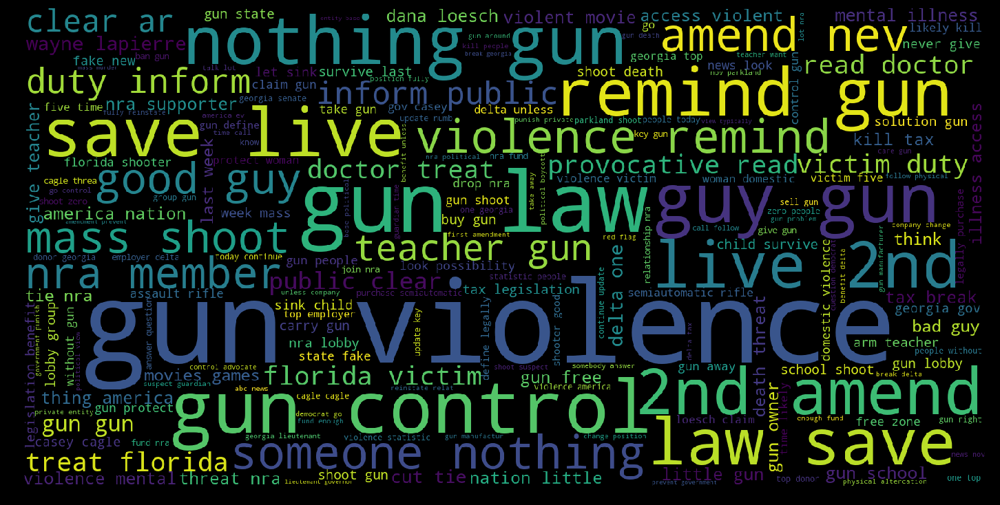

In [23]:
wordcloud = WordCloud(
        
                          background_color='black',
                          width=1600,
                          height=800).generate(tweet_str)


plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()


#### Obtain frequency word counts

In [24]:
def get_count(item):
    return item[1]
for word,count in sorted(TextBlob(tweet_str).word_counts.items(), key=get_count,reverse=True):
    print('%15s %i' % (word,count))

            gun 46727
            nra 19634
       violence 7278
         people 6407
          shoot 6172
            law 5128
         school 4702
        teacher 4586
          delta 4328
           want 4012
        georgia 3735
            one 3476
           kill 3395
        control 3261
           need 3228
           give 3171
            guy 2921
           live 2893
           take 2818
         member 2802
        florida 2788
            tax 2759
        nothing 2738
          right 2694
           time 2654
              1 2641
             go 2612
            let 2609
        america 2554
          fedex 2526
            2nd 2523
        someone 2517
              2 2516
           good 2470
           call 2426
           mass 2417
          trump 2367
             a… 2334
         victim 2323
              … 2245
            arm 2227
              u 2225
           save 2154
           stop 2151
        protect 2127
        company 2081
          break 2072
          t

         demand 164
        biggest 163
      guarantee 163
           jeni 162
        100,000 162
       horribly 162
           dear 161
           warn 161
        russian 161
              b 161
       rhetoric 161
       anti-gun 160
           hate 160
          sever 160
       majority 160
         bullet 160
         russia 159
         leader 159
            of… 159
           york 159
      systemize 159
          abide 158
         either 157
          safer 157
          annu… 157
         excuse 156
         worker 156
            rid 156
      venezuela 156
    manufacture 156
            cry 155
          large 155
       probably 155
           mind 155
           nra… 154
          that… 154
        account 154
           grab 154
         street 154
           get… 154
           walk 153
        include 153
          alert 153
         coward 152
          price 152
           meet 151
           dont 151
           name 151
           amid 151
        society 151


           vast 36
        similar 36
       eloiting 36
              ¯ 36
      mandatory 36
           hero 36
       detector 36
        denmark 36
  defense/sport 36
          crony 35
             um 35
            hub 35
          apply 35
        michael 35
        decline 35
     leadership 35
floridaschoolshooting 35
       everyday 35
        abandon 35
          stuff 35
      classmate 35
      necessary 35
           1996 35
           cite 35
     substitute 35
            aim 35
           wife 35
     california 35
   marksmanship 35
          guys… 35
       difficu… 35
thursdaythoughts 35
           rely 34
           giv… 34
         gunman 34
          sixty 34
          whore 34
           spat 34
       district 34
           blow 34
         fellow 34
          brown 34
       headline 34
      challenge 34
     convention 34
   registration 34
        speaker 34
           rise 34
        confuse 34
         deadly 34
       properly 34
         harden 34
     

        context 11
             eh 11
          ratio 11
         advice 11
        rescin… 11
           hair 11
         worthy 11
           law… 11
        germany 11
       gasoline 11
          third 11
     conscience 11
       hospital 11
        reuters 11
         pencil 11
        reflect 11
          armor 11
           path 11
       attitude 11
      professor 11
   municipality 11
           roof 11
       activity 11
          thick 11
        panther 11
           lord 11
        feature 11
      inanimate 11
        crusade 11
          straw 11
 alliedvanlines 11
        tantrum 11
             🤔🤔 11
       toughest 11
         reload 11
          legit 11
         scheme 11
  psychological 11
  significantly 11
         teach… 11
         media… 11
       function 11
            ira 11
           a…,5 11
          savvy 11
     peacemaker 11
       soldier… 11
  high-velocity 11
    switzerland 11
          85-95 11
      personnel 11
            rap 11
         opp

         yandex 6
       hoggwash 6
            br… 6
         bypass 6
   common-sense 6
       gonzales 6
       feminist 6
          memb… 6
         player 6
            wed 6
          penis 6
        histor… 6
           bike 6
    exclusively 6
          back… 6
        payroll 6
           pair 6
        blindly 6
            quo 6
        prevail 6
       protocol 6
            10k 6
        detroit 6
      skeptical 6
       conserv… 6
     grandchild 6
          sharp 6
         lunacy 6
     foundation 6
        forgive 6
     teriminate 6
            🤔🤔🤔 6
      boycottn… 6
         volume 6
           dope 6
            the 6
      sincerely 6
        examine 6
         relief 6
     legitimate 6
    entitlement 6
      afternoon 6
             pm 6
           lean 6
   intervention 6
      devastate 6
      condition 6
        sweetie 6
            tea 6
           acct 6
           echo 6
          candy 6
       textbook 6
        helpful 6
    psychiatric 6
       tac

           act… 4
          slimy 4
           eing 4
           18th 4
      virtually 4
      workplace 4
            pta 4
         delta… 4
           plea 4
       einstein 4
         viagra 4
           camo 4
         cretin 4
            fi… 4
       retweet… 4
        someday 4
          stud… 4
      unguarded 4
     misconduct 4
       marksman 4
            hug 4
        bueller 4
          chain 4
             ed 4
        classic 4
           2022 4
           dang 4
       predator 4
         contr… 4
          rambo 4
     admendment 4
            esp 4
          budge 4
         asshat 4
           mute 4
            321 4
         afloat 4
       engineer 4
    impeachment 4
          vista 4
         pardon 4
           text 4
  trump/nra/gop 4
       relevant 4
  nothing-jesus 4
         sooner 4
       pakistan 4
            sc… 4
         forbid 4
     frequently 4
        confine 4
    drainthenra 4
  sanctimonious 4
           men… 4
         trumpy 4
         a

             fo 2
          snark 2
            amd 2
            4-5 2
            …by 2
       driveway 2
gop_trashgass_bags 2
          cynic 2
         raiser 2
     capitalize 2
             dl 2
            ken 2
           nee… 2
            fav 2
     memes/gifs 2
 trumpnrapuppet 2
         semper 2
             fi 2
         louder 2
         saftey 2
       beginner 2
unconstitutionally 2
            8.5 2
     definately 2
          rath… 2
       eastwood 2
         20,000 2
          won'… 2
trumpsupporters 2
       delicate 2
         flower 2
 politicization 2
           ca42 2
teacher4congres… 2
           lbgt 2
      substance 2
          julia 2
    foolishness 2
          only… 2
           typo 2
        buh-bye 2
             3m 2
        marissa 2
        airfare 2
          rinos 2
             4… 2
      editorial 2
      left-wing 2
        darling 2
        inquire 2
        pendejo 2
shooters—except 2
       one—came 2
           sub… 2
         malkin 2
   

      supremacy 2
     referendum 2
        hannity 2
          argu… 2
          ralph 2
        northam 2
            shy 2
         juiced 2
        turnout 2
    dem-aligned 2
        reform… 2
            ijs 2
           stat 2
mischaracterize 2
         looser 2
            762 2
       murders… 2
      comprable 2
    regulation… 2
       modifier 2
           t…,1 2
         cheese 2
            sig 2
         corker 2
          eects 2
        marcher 2
       guns/gun 2
         duress 2
      mcdonalds 2
       fixation 2
           res… 2
       mistreat 2
     student…,1 2
       funniest 2
      guns=more 2
    impractical 2
         hostin 2
        numb…,1 2
        gunnuts 2
          stil… 2
        audien… 2
         devise 2
        foolery 2
           tlot 2
       patently 2
           thee 2
       securely 2
             71 2
         mishap 2
       headdesk 2
      alcoholic 2
         there4 2
     nationally 2
          tempt 2
        stiffer 2
   psychia

   nraterrorist 1
     immaterial 1
  jabbathetrump 1
      attribute 1
       peri…,11 1
         worke… 1
            hah 1
     stopvoting 1
   oversimplify 1
          don'… 1
           menu 1
         iconic 1
         eatery 1
        demcrat 1
      threa…,20 1
      backwoods 1
     2018change 1
         mysel… 1
   headquarterd 1
      freedom,5 1
2ashallnotbeinfringed… 1
            6am 1
       bringin… 1
   corosponding 1
        2a,2013 1
      r-georgia 1
          gaffe 1
   constitutio… 1
         be…,48 1
       tactless 1
   yougodelta,5 1
        democr… 1
      retweets🤫 1
           …the 1
         sport… 1
     treasonous 1
        ubering 1
           demo 1
         hreaks 1
         defund 1
         refund 1
            pan 1
        browser 1
       rationa… 1
          you.… 1
     craigwhyte 1
       realanus 1
eternaldamnation 1
          dept… 1
     preferent… 1
     censorship 1
       instead… 1
       10/26/16 1
        ungodly 1
       10/27/16 1
  

           cnns 1
          salem 1
spokes-students 1
thedickeyamendment 1
         estate 1
       reynolds 1
         oconee 1
    deltanazism 1
boycottallcompaniesthatsupportthenra 1
badventriloquistact 1
registerfirearms 1
2ndamendmentrights 1
         and.of 1
     obligatory 1
          77.4k 1
          oooow 1
shoveamusketupyourass 1
banassaultriflesnow 1
   govrickscott 1
        geo…,20 1
           neal 1
       rifles.… 1
           dad… 1
      ourselve… 1
       weaponto 1
  letthatsinkin 1
  konservatives 1
      posterior 1
       co-wrote 1
            noc 1
      infuelnce 1
        matthew 1
            624 1
           claw 1
            401 1
         00bama 1
   something,21 1
      far-right 1
  hate-mongerer 1
      portion,1 1
         snotty 1
     with…,2016 1
    statements… 1
            ish 1
  supporter…,20 1
      finances… 1
           nois 1
  …,20/philando 1
       governo… 1
          iam,1 1
       huckabee 1
     accusation 1
          afgan 1
    

        freebee 1
          shtik 1
     anti-union 1
        freight 1
         build… 1
      indenture 1
          elope 1
       cherokee 1
         plasma 1
           fdex 1
           589k 1
        gov…,78 1
 fundamentalist 1
           sect 1
    liberty,2nd 1
     amnendment 1
   predilection 1
            lst 1
            sme 1
            tme 1
      ignor.the 1
         thrvng 1
            thn 1
          list2 1
           sme1 1
          wtchs 1
     timesupnra 1
   obscurantism 1
     hopelessly 1
       by…,2016 1
           3500 1
     complicent 1
    molestation 1
         ribbon 1
        cutting 1
          medal 1
           whiz 1
        form…,7 1
      compleate 1
    preordering 1
nutritionist/dietitian 1
            wic 1
         celiac 1
       diabetic 1
   post-america 1
progressofascist 1
      astroturf 1
        mockery 1
         finrst 1
          awwww 1
         widdle 1
      feeweengs 1
      pro-shoot 1
   whackjobland 1
           duel 1
co

            pjs 1
         off/on 1
       crazyman 1
         spons… 1
        screwps 1
        w…,2017 1
      adjective 1
       nomorebs 1
    detrimental 1
       define,5 1
           frat 1
        delta,1 1
   non-thinking 1
        console 1
        jerkoff 1
      nrarussia 1
         lookin 1
     coherently 1
     rationall… 1
      powerplay 1
        doesn'… 1
enoughisenoug…,2013 1
          daca… 1
americanterrorists 1
          marc… 1
     publically 1
      amendmen… 1
    supporting… 1
        i…,74.6 1
      airliines 1
      wrongfuly 1
       memebers 1
           amnd 1
      constitu… 1
          teac… 1
            370 1
      beavis,71 1
         high-… 1
           gear 1
democratsbelieve 1
    facilitator 1
         toliet 1
          itgun 1
 conservative,2 1
   constituency 1
conorlambforcongress 1
        wethep… 1
            jo… 1
       palpable 1
      invations 1
     immorality 1
       handmade 1
         geezer 1
      obscurity 1
         mumble

  brand…,33,000 1
        descend 1
             vt 1
   bump…,33,000 1
   yup.true.the 1
       gun…,2/2 1
          f'ing 1
   crazy-stupid 1
 gunskillpeople 1
 ourkidsnotsafe 1
            fob 1
       hands/we 1
revolution/internal 1
        errbody 1
      hurraaaay 1
effects/outputs 1
      no/barely 1
    srgroupchat 1
          seven 1
       back.esp 1
         t…,5'6 1
         si…,67 1
      ar-15…,90 1
       enterta… 1
          week… 1
        bonanza 1
 grandfathering 1
shooter/murderer 1
   stressed-out 1
          shane 1
          1,400 1
       reprsntg 1
          trgdy 1
         o…,5'6 1
             od 1
       dispatch 1
           cenk 1
        phillip 1
         morris 1
           1964 1
livesmattermorethanyourguns 1
gunslingingteachers 1
          carr… 1
      whatatime 1
    ridiculous… 1
    teacher,5'6 1
     squi…,2018 1
        twitwit 1
         smarta 1
nraspreadliesandfear 1
nraterroristorganisation 1
 lapierreisscum 1
     ev…,33,000 1
          b

    justcurious 1
puredamneviltheyare 1
           4473 1
         bauers 1
        therein 1
         stymie 1
   floridahouse 1
     nraownsgop 1
greedoverpeople 1
       thankful 1
    misconstrue 1
        cnnsotu 1
        clapper 1
           foil 1
            div 1
      pantyhose 1
     gui…,4/the 1
          rebut 1
           erg… 1
         h…,1st 1
     succinctly 1
      doyourjob 1
     safes+guns 1
          hella 1
        diehard 1
   chickenhawks 1
    regulated.… 1
         themir 1
          ninja 1
       simplify 1
    objectively 1
        compile 1
      imbecilic 1
     kid,33,000 1
gun-manufacturers 1
         uscpsc 1
        jurisd… 1
          1900s 1
ratiocination,4 1
        belueve 1
            ela 1
         lesion 1
incarceration,33,000 1
      amazingly 1
          wyatt 1
           earp 1
        copycat 1
            259 1
        homage… 1
        nev…,42 1
        deepest 1
        sadness 1
       pacifier 1
    pap…,33,000 1
       nut-jobs 1

       gunshows 1
       harmless 1
         he/she 1
   functionally 1
         mini14 1
          ranch 1
    knife..take 1
        guns-it 1
        guns-or 1
     answer-you 1
        redcoat 1
           bac… 1
        silicon 1
         valley 1
            lov 1
   kinda-stable 1
       comunity 1
       related🤔 1
        actully 1
         hav…,1 1
   bandwhatever 1
         ar-10s 1
            gfy 1
      mindblown 1
  presidentdump 1
   worldleaders 1
            atm 1
          aeryn 1
       librari… 1
      2005-2010 1
          3,800 1
       disprove 1
        stewart 1
   850-245-0505 1
       fledchat 1
  changethelaws 1
          irate 1
            hun 1
      reposting 1
       bullseye 1
      shot.they 1
         40,000 1
illegally/illegitimately 1
            yip 1
         sickee 1
   house/senate 1
    mass-murder 1
   consequently 1
            pip 1
            maa 1
            pps 1
         barel… 1
   endthestigma 1
     problem,14 1
    theirselves 1
 

### LDA Analysis

In [27]:
from gensim import corpora, models, similarities, matutils
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans


In [37]:
count_vectorizer = CountVectorizer(ngram_range=(1,2),stop_words='english',token_pattern='\\b[a-z][a-z]+\\b')

count_vectorizer.fit(tweet_cln)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 2), preprocessor=None, stop_words='english',
        strip_accents=None, token_pattern='\\b[a-z][a-z]+\\b',
        tokenizer=None, vocabulary=None)

In [38]:
#Create the term-document matrix and transpose so the terms are the rows
counts = count_vectorizer.transform(tweet_cln).transpose()

In [39]:
counts.shape


(129972, 60000)

#### Convert to gensim

In [40]:
# Convert sparse matrix of counts to a gensim corpus
corpus = matutils.Sparse2Corpus(counts)

In [41]:
corpus

#### Mapping matrix rows to tokens

In [42]:
id2word = dict((v,k) for k,v in count_vectorizer.vocabulary_.items())

In [43]:
id2word

{128979: 'year',
 2509: 'ago',
 114420: 'terrorist',
 7206: 'attack',
 127934: 'world',
 117859: 'trade',
 16558: 'center',
 116644: 'time',
 76464: 'nra',
 96242: 'responsible',
 40522: 'fo',
 128984: 'year ago',
 2563: 'ago terrorist',
 114427: 'terrorist attack',
 7355: 'attack world',
 128075: 'world trade',
 117861: 'trade center',
 16571: 'center time',
 116857: 'time nra',
 77715: 'nra responsible',
 96258: 'responsible fo',
 106522: 'sorry',
 90186: 'protect',
 18829: 'class',
 17197: 'check',
 66045: 'lobby',
 80604: 'organization',
 88766: 'private',
 20616: 'company',
 28568: 'delta',
 97329: 'right',
 26243: 'cut',
 116492: 'tie',
 42226: 'fun',
 120852: 'unemployment',
 65173: 'line',
 34293: 'election',
 19998: 'come',
 106569: 'sorry nra',
 77622: 'nra protect',
 90224: 'protect class',
 18840: 'class check',
 17298: 'check lobby',
 66134: 'lobby organization',
 80719: 'organization private',
 88772: 'private company',
 20697: 'company delta',
 28825: 'delta right',
 974

In [134]:
# for tweet in results:
#     if (not tweet.retweeted) and ('RT @' not in tweet.full_text):
#         print(tweet.full_text)

@CaseyCagle @Delta @NRA Sorry but when did the NRA become a protected class? Because last I checked they are a lobby organization and as a private company Delta has the right to cut ties with them. 

Have fun on the unemployment line when your elections come up!
@RennieTiffany @NBCNews @realDonaldTrump Prime member for over 5 years asking you to keep your relationship with NRA #ResignIsrael #ObamaGate
We should all join the NRA just to piss off liberals. 
It’s $30.00  a year or $100 for 5 years!  🇱🇷#MAGA
@browardsheriff @NRA No coward Israel, you did not stand up for them. Youre a failure. #FireScottIsrael
@FedEx End your partnership with the NRA: https://t.co/m9JPtPjmwB #NeverAgain #BoycottNRA @MoveOn
@100yardgrouping I’m boycotting and company that does business with the NRA I’m helping https://t.co/Aan0c8rRXF
So... dodging @realDonaldTrump would stand up to a guy lighting up a school w/an AR-15, but won’t stand up to the the people in the “fellowship organization” (per @NRA mouthpie

### LDA Modeling

In [47]:
lda = models.LdaModel(corpus=corpus, num_topics=8, minimum_probability=.03, id2word=id2word,passes=10)

2018-03-02 16:10:22,208 : INFO : using symmetric alpha at 0.125
2018-03-02 16:10:22,211 : INFO : using symmetric eta at 0.125
2018-03-02 16:10:22,231 : INFO : using serial LDA version on this node
2018-03-02 16:10:27,355 : INFO : running online (multi-pass) LDA training, 8 topics, 10 passes over the supplied corpus of 60000 documents, updating model once every 2000 documents, evaluating perplexity every 20000 documents, iterating 50x with a convergence threshold of 0.001000
2018-03-02 16:10:27,367 : INFO : PROGRESS: pass 0, at document #2000/60000
2018-03-02 16:10:30,569 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:10:30,671 : INFO : topic #6 (0.125): 0.018*"nra" + 0.012*"gun" + 0.007*"delta" + 0.006*"tax" + 0.006*"school" + 0.005*"time" + 0.004*"georgia" + 0.003*"member" + 0.003*"work" + 0.003*"kid"
2018-03-02 16:10:30,673 : INFO : topic #4 (0.125): 0.040*"nra" + 0.008*"let" + 0.007*"delta" + 0.007*"business" + 0.006*"shoot" + 0.006*"membe

2018-03-02 16:10:38,900 : INFO : topic diff=0.214926, rho=0.408248
2018-03-02 16:10:38,916 : INFO : PROGRESS: pass 0, at document #14000/60000
2018-03-02 16:10:40,071 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:10:40,441 : INFO : topic #4 (0.125): 0.041*"nra" + 0.017*"shoot" + 0.017*"let" + 0.014*"threat" + 0.013*"death" + 0.013*"child" + 0.012*"mass" + 0.012*"supporter" + 0.012*"mass shoot" + 0.012*"death threat"
2018-03-02 16:10:40,444 : INFO : topic #1 (0.125): 0.020*"nra" + 0.014*"gun" + 0.007*"support" + 0.004*"love" + 0.004*"democrat" + 0.004*"assault" + 0.004*"liberal" + 0.004*"people" + 0.004*"member" + 0.004*"weapon"
2018-03-02 16:10:40,448 : INFO : topic #3 (0.125): 0.044*"nra" + 0.008*"fedex" + 0.008*"money" + 0.007*"discount" + 0.006*"stand" + 0.006*"member" + 0.005*"extortion" + 0.005*"stand nra" + 0.004*"felony" + 0.004*"decision"
2018-03-02 16:10:40,451 : INFO : topic #5 (0.125): 0.032*"nra" + 0.008*"support" + 0.008*"compan

2018-03-02 16:10:49,927 : INFO : PROGRESS: pass 0, at document #26000/60000
2018-03-02 16:10:50,975 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:10:51,387 : INFO : topic #7 (0.125): 0.035*"delta" + 0.034*"georgia" + 0.025*"tax" + 0.017*"nra" + 0.014*"cut" + 0.014*"cagle" + 0.014*"tie" + 0.013*"break" + 0.012*"unless" + 0.012*"benefit"
2018-03-02 16:10:51,391 : INFO : topic #1 (0.125): 0.018*"nra" + 0.015*"gun" + 0.009*"support" + 0.005*"democrat" + 0.005*"assault" + 0.005*"liberal" + 0.004*"love" + 0.004*"people" + 0.004*"conservative" + 0.004*"weapon"
2018-03-02 16:10:51,394 : INFO : topic #3 (0.125): 0.043*"nra" + 0.010*"fedex" + 0.008*"money" + 0.007*"member" + 0.006*"discount" + 0.006*"extortion" + 0.005*"stand" + 0.005*"felony" + 0.005*"extortion felony" + 0.005*"bigshot"
2018-03-02 16:10:51,398 : INFO : topic #4 (0.125): 0.041*"nra" + 0.019*"shoot" + 0.016*"let" + 0.015*"threat" + 0.014*"mass" + 0.014*"death" + 0.013*"child" + 0.013*"

2018-03-02 16:11:02,650 : INFO : topic #0 (0.125): 0.033*"gun" + 0.016*"teacher" + 0.016*"save" + 0.015*"nra" + 0.015*"save live" + 0.014*"treat" + 0.014*"live" + 0.014*"duty" + 0.012*"public" + 0.012*"violence"
2018-03-02 16:11:02,653 : INFO : topic #3 (0.125): 0.028*"nra" + 0.016*"gun control" + 0.015*"control" + 0.012*"gun" + 0.010*"flag" + 0.010*"red flag" + 0.008*"oppose" + 0.007*"lobbyist" + 0.006*"time" + 0.006*"red"
2018-03-02 16:11:02,657 : INFO : topic #4 (0.125): 0.026*"shoot" + 0.021*"school" + 0.018*"clear" + 0.017*"florida" + 0.017*"inform" + 0.016*"nra" + 0.015*"victim" + 0.014*"bad" + 0.013*"mass" + 0.012*"bad guy"
2018-03-02 16:11:02,661 : INFO : topic #7 (0.125): 0.025*"remind" + 0.024*"delta" + 0.023*"georgia" + 0.020*"solution" + 0.017*"tax" + 0.014*"break" + 0.012*"nra" + 0.011*"zone" + 0.011*"cut" + 0.010*"unless"
2018-03-02 16:11:02,664 : INFO : topic diff=0.334479, rho=0.229416
2018-03-02 16:11:05,198 : INFO : -9.171 per-word bound, 576.4 perplexity estimate bas

2018-03-02 16:11:16,097 : INFO : topic #7 (0.125): 0.047*"remind" + 0.037*"solution" + 0.015*"control gun" + 0.014*"zone" + 0.013*"gun free" + 0.012*"free" + 0.012*"free zone" + 0.012*"break" + 0.008*"unless" + 0.008*"delta"
2018-03-02 16:11:16,101 : INFO : topic #2 (0.125): 0.017*"gun" + 0.016*"nra" + 0.013*"answer" + 0.012*"mental" + 0.012*"america" + 0.011*"fund" + 0.011*"protect" + 0.010*"wayne" + 0.010*"teacher" + 0.010*"want"
2018-03-02 16:11:16,105 : INFO : topic #6 (0.125): 0.092*"gun" + 0.017*"violence" + 0.013*"people" + 0.012*"buy" + 0.010*"gun violence" + 0.009*"gun gun" + 0.008*"people gun" + 0.007*"law" + 0.007*"time" + 0.007*"kill"
2018-03-02 16:11:16,108 : INFO : topic #3 (0.125): 0.025*"gun control" + 0.023*"control" + 0.020*"gun" + 0.013*"nra" + 0.010*"porn" + 0.009*"sell" + 0.008*"time" + 0.008*"right" + 0.008*"advocate" + 0.007*"vote"
2018-03-02 16:11:16,112 : INFO : topic diff=0.287199, rho=0.200000
2018-03-02 16:11:16,129 : INFO : PROGRESS: pass 0, at document #52

2018-03-02 16:11:28,681 : INFO : topic #1 (0.125): 0.113*"gun" + 0.020*"gun law" + 0.012*"teacher" + 0.010*"guy gun" + 0.010*"want" + 0.008*"people" + 0.008*"gun violence" + 0.008*"problem" + 0.008*"law" + 0.007*"need"
2018-03-02 16:11:28,684 : INFO : topic #3 (0.125): 0.022*"gun" + 0.022*"gun control" + 0.019*"control" + 0.017*"nra" + 0.010*"advocate" + 0.009*"sell" + 0.009*"right" + 0.008*"time" + 0.007*"care" + 0.006*"fewer"
2018-03-02 16:11:28,689 : INFO : topic #4 (0.125): 0.030*"shoot" + 0.025*"school" + 0.017*"mass" + 0.013*"victim" + 0.013*"florida" + 0.012*"clear" + 0.012*"nra" + 0.011*"mass shoot" + 0.011*"gun school" + 0.011*"inform"
2018-03-02 16:11:28,693 : INFO : topic #0 (0.125): 0.058*"gun" + 0.031*"gun violence" + 0.031*"violence" + 0.020*"live" + 0.020*"law" + 0.019*"save" + 0.018*"save live" + 0.018*"remind gun" + 0.018*"live amend" + 0.018*"violence remind"
2018-03-02 16:11:28,696 : INFO : topic diff=0.300666, rho=0.176777
2018-03-02 16:11:28,711 : INFO : PROGRESS: 

2018-03-02 16:11:39,099 : INFO : topic #5 (0.125): 0.021*"gun" + 0.014*"nra" + 0.009*"people" + 0.009*"good" + 0.008*"look" + 0.007*"kill" + 0.006*"guy" + 0.006*"shoot" + 0.006*"update" + 0.005*"state"
2018-03-02 16:11:39,103 : INFO : topic #2 (0.125): 0.024*"nra" + 0.008*"fail" + 0.007*"government" + 0.007*"gun" + 0.007*"trump" + 0.007*"wayne" + 0.007*"lapierre" + 0.006*"protect" + 0.006*"wayne lapierre" + 0.006*"want"
2018-03-02 16:11:39,108 : INFO : topic diff=0.244356, rho=0.176777
2018-03-02 16:11:39,124 : INFO : PROGRESS: pass 1, at document #16000/60000
2018-03-02 16:11:39,991 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:11:40,396 : INFO : topic #4 (0.125): 0.034*"nra" + 0.023*"shoot" + 0.014*"let" + 0.014*"mass" + 0.013*"mass shoot" + 0.013*"death" + 0.012*"threat" + 0.012*"child" + 0.012*"school" + 0.011*"week"
2018-03-02 16:11:40,400 : INFO : topic #0 (0.125): 0.027*"nra" + 0.025*"gun" + 0.012*"plan" + 0.012*"gun violence" + 0.012

2018-03-02 16:11:48,569 : INFO : topic #2 (0.125): 0.024*"nra" + 0.009*"government" + 0.008*"fail" + 0.007*"discount" + 0.007*"amendment" + 0.007*"private" + 0.006*"political" + 0.006*"base" + 0.006*"punish" + 0.006*"trump"
2018-03-02 16:11:48,574 : INFO : topic diff=0.224323, rho=0.176777
2018-03-02 16:11:48,590 : INFO : PROGRESS: pass 1, at document #28000/60000
2018-03-02 16:11:49,411 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:11:49,771 : INFO : topic #0 (0.125): 0.039*"nra" + 0.014*"gun" + 0.012*"need" + 0.010*"boycott" + 0.009*"member" + 0.009*"discount" + 0.009*"political" + 0.007*"fedex" + 0.007*"nra member" + 0.007*"plan"
2018-03-02 16:11:49,773 : INFO : topic #3 (0.125): 0.043*"nra" + 0.010*"fedex" + 0.008*"money" + 0.007*"member" + 0.007*"discount" + 0.006*"extortion" + 0.005*"right" + 0.005*"stand" + 0.005*"support" + 0.005*"felony"
2018-03-02 16:11:49,777 : INFO : topic #5 (0.125): 0.022*"nra" + 0.010*"gun" + 0.007*"company" +

2018-03-02 16:11:58,795 : INFO : PROGRESS: pass 1, at document #40000/60000
2018-03-02 16:11:59,708 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:12:00,151 : INFO : topic #0 (0.125): 0.050*"gun" + 0.025*"gun violence" + 0.025*"violence" + 0.016*"law" + 0.015*"live" + 0.015*"treat" + 0.015*"save" + 0.015*"public" + 0.015*"nra" + 0.015*"duty"
2018-03-02 16:12:00,154 : INFO : topic #5 (0.125): 0.038*"gun" + 0.016*"good" + 0.012*"good guy" + 0.012*"doctor" + 0.011*"guy" + 0.011*"people" + 0.008*"nra" + 0.008*"dana" + 0.008*"look" + 0.008*"loesch"
2018-03-02 16:12:00,158 : INFO : topic #7 (0.125): 0.027*"delta" + 0.026*"georgia" + 0.019*"tax" + 0.018*"solution" + 0.017*"break" + 0.014*"nra" + 0.012*"zone" + 0.012*"cut" + 0.011*"free zone" + 0.011*"tie"
2018-03-02 16:12:00,162 : INFO : topic #3 (0.125): 0.026*"nra" + 0.015*"gun control" + 0.013*"control" + 0.013*"gun" + 0.007*"lobbyist" + 0.007*"flag" + 0.007*"advocate" + 0.007*"red flag" + 0.007*

2018-03-02 16:12:08,524 : INFO : topic #6 (0.125): 0.085*"gun" + 0.015*"people" + 0.013*"buy" + 0.013*"violence" + 0.012*"gun gun" + 0.011*"gun violence" + 0.008*"people gun" + 0.008*"victim" + 0.007*"buy gun" + 0.007*"year"
2018-03-02 16:12:08,528 : INFO : topic #7 (0.125): 0.032*"solution" + 0.015*"break" + 0.014*"control gun" + 0.013*"zone" + 0.011*"gun free" + 0.011*"delta" + 0.011*"georgia" + 0.011*"free zone" + 0.010*"free" + 0.009*"tax"
2018-03-02 16:12:08,531 : INFO : topic #3 (0.125): 0.021*"gun control" + 0.021*"gun" + 0.019*"control" + 0.014*"nra" + 0.009*"sell" + 0.009*"time" + 0.008*"advocate" + 0.008*"right" + 0.008*"porn" + 0.007*"parkland"
2018-03-02 16:12:08,536 : INFO : topic #0 (0.125): 0.062*"gun" + 0.031*"violence" + 0.031*"gun violence" + 0.020*"live" + 0.020*"law" + 0.019*"save" + 0.019*"treat" + 0.018*"duty" + 0.018*"save live" + 0.018*"amend"
2018-03-02 16:12:08,539 : INFO : topic diff=0.253029, rho=0.176777
2018-03-02 16:12:08,556 : INFO : PROGRESS: pass 1, at

2018-03-02 16:12:18,567 : INFO : topic #6 (0.125): 0.074*"gun" + 0.015*"people" + 0.012*"violence" + 0.012*"buy" + 0.011*"gun gun" + 0.010*"gun violence" + 0.009*"nra" + 0.007*"people gun" + 0.007*"law" + 0.006*"claim"
2018-03-02 16:12:18,571 : INFO : topic #7 (0.125): 0.022*"delta" + 0.020*"georgia" + 0.016*"solution" + 0.014*"nra" + 0.014*"tax" + 0.013*"break" + 0.009*"cut" + 0.009*"tie" + 0.008*"cagle" + 0.007*"company"
2018-03-02 16:12:18,576 : INFO : topic #4 (0.125): 0.028*"shoot" + 0.020*"school" + 0.019*"nra" + 0.016*"mass" + 0.012*"mass shoot" + 0.011*"death" + 0.011*"ar" + 0.011*"florida" + 0.010*"clear" + 0.009*"victim"
2018-03-02 16:12:18,579 : INFO : topic #3 (0.125): 0.022*"nra" + 0.019*"gun" + 0.016*"gun control" + 0.015*"control" + 0.008*"advocate" + 0.008*"sell" + 0.008*"right" + 0.007*"time" + 0.006*"care" + 0.005*"parkland"
2018-03-02 16:12:18,584 : INFO : topic diff=0.241784, rho=0.174078
2018-03-02 16:12:18,599 : INFO : PROGRESS: pass 2, at document #6000/60000
201

2018-03-02 16:12:25,775 : INFO : topic #5 (0.125): 0.022*"gun" + 0.016*"nra" + 0.009*"people" + 0.008*"good" + 0.007*"look" + 0.007*"kill" + 0.006*"guy" + 0.005*"shoot" + 0.005*"state" + 0.005*"update"
2018-03-02 16:12:25,779 : INFO : topic #0 (0.125): 0.027*"gun" + 0.027*"nra" + 0.012*"violence" + 0.012*"gun violence" + 0.012*"plan" + 0.010*"need" + 0.009*"law" + 0.008*"live" + 0.008*"save" + 0.008*"thing"
2018-03-02 16:12:25,784 : INFO : topic diff=0.214901, rho=0.174078
2018-03-02 16:12:25,800 : INFO : PROGRESS: pass 2, at document #18000/60000
2018-03-02 16:12:26,628 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:12:26,990 : INFO : topic #3 (0.125): 0.041*"nra" + 0.008*"fedex" + 0.007*"gun" + 0.007*"money" + 0.006*"discount" + 0.006*"member" + 0.006*"right" + 0.006*"gun control" + 0.005*"control" + 0.005*"extortion"
2018-03-02 16:12:26,993 : INFO : topic #7 (0.125): 0.035*"delta" + 0.032*"georgia" + 0.022*"tax" + 0.019*"nra" + 0.015*"brea

2018-03-02 16:12:34,770 : INFO : topic #2 (0.125): 0.024*"nra" + 0.009*"government" + 0.007*"amendment" + 0.007*"discount" + 0.007*"fail" + 0.007*"private" + 0.006*"political" + 0.006*"base" + 0.006*"punish" + 0.006*"view"
2018-03-02 16:12:34,775 : INFO : topic diff=0.183142, rho=0.174078
2018-03-02 16:12:34,791 : INFO : PROGRESS: pass 2, at document #30000/60000
2018-03-02 16:12:35,595 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:12:35,923 : INFO : topic #4 (0.125): 0.039*"nra" + 0.024*"shoot" + 0.016*"let" + 0.016*"mass" + 0.015*"mass shoot" + 0.014*"threat" + 0.013*"death" + 0.012*"week" + 0.012*"child" + 0.011*"supporter"
2018-03-02 16:12:35,927 : INFO : topic #7 (0.125): 0.038*"delta" + 0.036*"georgia" + 0.026*"tax" + 0.018*"nra" + 0.017*"break" + 0.015*"cut" + 0.015*"governor" + 0.015*"tie" + 0.013*"cagle" + 0.011*"unless"
2018-03-02 16:12:35,931 : INFO : topic #0 (0.125): 0.041*"nra" + 0.013*"gun" + 0.012*"need" + 0.010*"boycott" + 0

2018-03-02 16:12:44,460 : INFO : topic diff=0.252796, rho=0.174078
2018-03-02 16:12:44,478 : INFO : PROGRESS: pass 2, at document #42000/60000
2018-03-02 16:12:45,364 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:12:45,772 : INFO : topic #4 (0.125): 0.025*"shoot" + 0.020*"florida" + 0.019*"ar" + 0.019*"clear" + 0.018*"victim" + 0.018*"inform" + 0.018*"doctor" + 0.018*"duty inform" + 0.018*"inform public" + 0.018*"provocative"
2018-03-02 16:12:45,776 : INFO : topic #1 (0.125): 0.103*"gun" + 0.015*"gun law" + 0.013*"guy gun" + 0.010*"want" + 0.010*"teacher" + 0.008*"law" + 0.007*"guy" + 0.007*"problem" + 0.007*"need" + 0.007*"control"
2018-03-02 16:12:45,780 : INFO : topic #7 (0.125): 0.025*"delta" + 0.024*"georgia" + 0.021*"solution" + 0.018*"tax" + 0.016*"break" + 0.013*"zone" + 0.013*"nra" + 0.012*"free zone" + 0.012*"gun free" + 0.011*"cut"
2018-03-02 16:12:45,784 : INFO : topic #6 (0.125): 0.069*"gun" + 0.013*"people" + 0.010*"violence" +

2018-03-02 16:12:53,750 : INFO : topic #5 (0.125): 0.052*"gun" + 0.016*"good" + 0.015*"people" + 0.013*"teacher" + 0.013*"guy" + 0.012*"good guy" + 0.009*"teacher gun" + 0.009*"kill" + 0.009*"look" + 0.009*"shoot"
2018-03-02 16:12:53,753 : INFO : topic #2 (0.125): 0.021*"gun" + 0.018*"nra" + 0.014*"news" + 0.013*"answer" + 0.012*"fund" + 0.012*"wayne" + 0.011*"lapierre" + 0.011*"america" + 0.011*"wayne lapierre" + 0.011*"protect"
2018-03-02 16:12:53,757 : INFO : topic #6 (0.125): 0.087*"gun" + 0.016*"people" + 0.014*"buy" + 0.013*"gun gun" + 0.011*"violence" + 0.010*"gun violence" + 0.009*"people gun" + 0.008*"victim" + 0.007*"buy gun" + 0.006*"year"
2018-03-02 16:12:53,761 : INFO : topic #7 (0.125): 0.034*"solution" + 0.016*"break" + 0.013*"control gun" + 0.013*"zone" + 0.011*"gun free" + 0.011*"free zone" + 0.010*"delta" + 0.010*"free" + 0.009*"georgia" + 0.008*"tax"
2018-03-02 16:12:53,764 : INFO : topic #4 (0.125): 0.027*"shoot" + 0.023*"florida" + 0.022*"school" + 0.022*"ar" + 0.0

2018-03-02 16:13:03,356 : INFO : topic #7 (0.125): 0.026*"delta" + 0.024*"georgia" + 0.016*"nra" + 0.016*"tax" + 0.013*"break" + 0.012*"solution" + 0.010*"cut" + 0.010*"tie" + 0.009*"cagle" + 0.008*"company"
2018-03-02 16:13:03,361 : INFO : topic #6 (0.125): 0.066*"gun" + 0.014*"people" + 0.011*"buy" + 0.011*"nra" + 0.009*"gun gun" + 0.009*"violence" + 0.008*"gun violence" + 0.007*"law" + 0.006*"people gun" + 0.006*"use"
2018-03-02 16:13:03,365 : INFO : topic #0 (0.125): 0.049*"gun" + 0.026*"violence" + 0.026*"gun violence" + 0.016*"law" + 0.016*"live" + 0.015*"save" + 0.014*"save live" + 0.014*"remind" + 0.014*"amend" + 0.014*"remind gun"
2018-03-02 16:13:03,369 : INFO : topic #5 (0.125): 0.041*"gun" + 0.013*"people" + 0.013*"good" + 0.010*"teacher" + 0.010*"guy" + 0.009*"kill" + 0.009*"good guy" + 0.009*"look" + 0.008*"shoot" + 0.008*"update"
2018-03-02 16:13:03,374 : INFO : topic diff=0.221809, rho=0.171499
2018-03-02 16:13:03,397 : INFO : PROGRESS: pass 3, at document #8000/60000
2

2018-03-02 16:13:10,295 : INFO : topic #4 (0.125): 0.036*"nra" + 0.023*"shoot" + 0.015*"mass" + 0.015*"let" + 0.014*"mass shoot" + 0.014*"death" + 0.013*"threat" + 0.012*"child" + 0.012*"week" + 0.011*"supporter"
2018-03-02 16:13:10,300 : INFO : topic #1 (0.125): 0.048*"gun" + 0.010*"nra" + 0.007*"gun law" + 0.007*"want" + 0.006*"support" + 0.005*"people" + 0.005*"need" + 0.005*"law" + 0.004*"democrat" + 0.004*"teacher"
2018-03-02 16:13:10,304 : INFO : topic diff=0.195619, rho=0.171499
2018-03-02 16:13:12,037 : INFO : -8.940 per-word bound, 491.0 perplexity estimate based on a held-out corpus of 2000 documents with 35121 words
2018-03-02 16:13:12,039 : INFO : PROGRESS: pass 3, at document #20000/60000
2018-03-02 16:13:12,827 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:13:13,179 : INFO : topic #7 (0.125): 0.036*"delta" + 0.034*"georgia" + 0.023*"tax" + 0.019*"nra" + 0.016*"break" + 0.014*"cut" + 0.014*"tie" + 0.012*"governor" + 0.012*"cagle

2018-03-02 16:13:18,855 : INFO : topic #0 (0.125): 0.041*"nra" + 0.014*"gun" + 0.012*"need" + 0.010*"boycott" + 0.010*"discount" + 0.009*"political" + 0.009*"member" + 0.007*"nra member" + 0.007*"fedex" + 0.007*"right"
2018-03-02 16:13:18,858 : INFO : topic diff=0.183816, rho=0.171499
2018-03-02 16:13:18,875 : INFO : PROGRESS: pass 3, at document #32000/60000
2018-03-02 16:13:19,914 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:13:20,284 : INFO : topic #7 (0.125): 0.038*"delta" + 0.035*"georgia" + 0.025*"tax" + 0.018*"nra" + 0.017*"break" + 0.015*"cut" + 0.014*"governor" + 0.014*"tie" + 0.012*"cagle" + 0.011*"unless"
2018-03-02 16:13:20,288 : INFO : topic #5 (0.125): 0.021*"gun" + 0.017*"nra" + 0.009*"good" + 0.007*"people" + 0.006*"kill" + 0.006*"look" + 0.006*"guy" + 0.006*"good guy" + 0.005*"teacher" + 0.005*"shoot"
2018-03-02 16:13:20,293 : INFO : topic #4 (0.125): 0.033*"nra" + 0.026*"shoot" + 0.015*"mass" + 0.015*"school" + 0.014*"mass

2018-03-02 16:13:31,811 : INFO : topic diff=0.242691, rho=0.171499
2018-03-02 16:13:31,833 : INFO : PROGRESS: pass 3, at document #44000/60000
2018-03-02 16:13:32,769 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:13:33,184 : INFO : topic #7 (0.125): 0.024*"solution" + 0.023*"delta" + 0.021*"georgia" + 0.016*"tax" + 0.016*"break" + 0.014*"zone" + 0.012*"free zone" + 0.012*"gun free" + 0.012*"nra" + 0.010*"cut"
2018-03-02 16:13:33,187 : INFO : topic #0 (0.125): 0.057*"gun" + 0.029*"violence" + 0.029*"gun violence" + 0.017*"live" + 0.017*"law" + 0.017*"read" + 0.017*"treat" + 0.016*"save" + 0.016*"duty" + 0.016*"save live"
2018-03-02 16:13:33,191 : INFO : topic #6 (0.125): 0.073*"gun" + 0.013*"people" + 0.011*"buy" + 0.010*"gun gun" + 0.010*"violence" + 0.008*"gun violence" + 0.008*"victim" + 0.007*"people gun" + 0.007*"nra" + 0.007*"law"
2018-03-02 16:13:33,194 : INFO : topic #3 (0.125): 0.021*"nra" + 0.016*"gun" + 0.016*"gun control" + 0.015*

2018-03-02 16:13:41,656 : INFO : topic #2 (0.125): 0.021*"gun" + 0.017*"nra" + 0.014*"news" + 0.013*"answer" + 0.012*"wayne" + 0.011*"lapierre" + 0.011*"america" + 0.011*"wayne lapierre" + 0.011*"fund" + 0.011*"protect"
2018-03-02 16:13:41,659 : INFO : topic #4 (0.125): 0.029*"shoot" + 0.024*"school" + 0.021*"florida" + 0.021*"ar" + 0.019*"public" + 0.018*"victim" + 0.018*"clear" + 0.018*"inform" + 0.018*"doctor" + 0.017*"inform public"
2018-03-02 16:13:41,663 : INFO : topic #0 (0.125): 0.068*"gun" + 0.036*"violence" + 0.036*"gun violence" + 0.022*"live" + 0.021*"law" + 0.020*"save" + 0.019*"save live" + 0.019*"remind" + 0.019*"amend" + 0.019*"law save"
2018-03-02 16:13:41,668 : INFO : topic #5 (0.125): 0.053*"gun" + 0.016*"good" + 0.015*"people" + 0.015*"teacher" + 0.013*"guy" + 0.012*"good guy" + 0.010*"teacher gun" + 0.009*"violence" + 0.009*"kill" + 0.009*"look"
2018-03-02 16:13:41,673 : INFO : topic #7 (0.125): 0.034*"solution" + 0.018*"break" + 0.013*"control gun" + 0.012*"zone" 

2018-03-02 16:13:53,744 : INFO : topic #6 (0.125): 0.060*"gun" + 0.013*"people" + 0.012*"nra" + 0.010*"buy" + 0.008*"gun gun" + 0.008*"violence" + 0.007*"gun violence" + 0.007*"law" + 0.006*"people gun" + 0.006*"use"
2018-03-02 16:13:53,749 : INFO : topic #2 (0.125): 0.022*"nra" + 0.012*"gun" + 0.009*"wayne" + 0.009*"lapierre" + 0.008*"wayne lapierre" + 0.008*"news" + 0.008*"protect" + 0.008*"trump" + 0.007*"want" + 0.007*"government"
2018-03-02 16:13:53,755 : INFO : topic #4 (0.125): 0.027*"nra" + 0.025*"shoot" + 0.015*"mass" + 0.015*"school" + 0.012*"mass shoot" + 0.012*"death" + 0.010*"let" + 0.009*"week" + 0.009*"florida" + 0.009*"child"
2018-03-02 16:13:53,759 : INFO : topic #3 (0.125): 0.030*"nra" + 0.014*"gun" + 0.010*"gun control" + 0.010*"control" + 0.007*"right" + 0.006*"sell" + 0.006*"time" + 0.006*"money" + 0.006*"advocate" + 0.005*"fedex"
2018-03-02 16:13:53,766 : INFO : topic #7 (0.125): 0.029*"delta" + 0.027*"georgia" + 0.017*"nra" + 0.017*"tax" + 0.013*"break" + 0.011*"

2018-03-02 16:14:04,312 : INFO : topic #4 (0.125): 0.037*"nra" + 0.023*"shoot" + 0.016*"mass" + 0.015*"let" + 0.014*"mass shoot" + 0.014*"death" + 0.013*"threat" + 0.012*"child" + 0.012*"week" + 0.011*"supporter"
2018-03-02 16:14:04,316 : INFO : topic #0 (0.125): 0.031*"nra" + 0.023*"gun" + 0.010*"need" + 0.010*"violence" + 0.010*"gun violence" + 0.010*"plan" + 0.008*"boycott" + 0.007*"member" + 0.007*"political" + 0.007*"law"
2018-03-02 16:14:04,321 : INFO : topic #7 (0.125): 0.036*"delta" + 0.034*"georgia" + 0.023*"tax" + 0.019*"nra" + 0.015*"break" + 0.014*"cut" + 0.014*"tie" + 0.012*"governor" + 0.012*"cagle" + 0.011*"company"
2018-03-02 16:14:04,325 : INFO : topic diff=0.182975, rho=0.169031
2018-03-02 16:14:04,368 : INFO : PROGRESS: pass 4, at document #22000/60000
2018-03-02 16:14:05,406 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:14:05,777 : INFO : topic #4 (0.125): 0.038*"nra" + 0.023*"shoot" + 0.016*"mass" + 0.015*"let" + 0.015*"

2018-03-02 16:14:12,210 : INFO : topic #5 (0.125): 0.021*"gun" + 0.017*"nra" + 0.009*"good" + 0.007*"people" + 0.006*"kill" + 0.006*"look" + 0.006*"guy" + 0.006*"good guy" + 0.005*"teacher" + 0.005*"shoot"
2018-03-02 16:14:12,214 : INFO : topic diff=0.256558, rho=0.169031
2018-03-02 16:14:12,233 : INFO : PROGRESS: pass 4, at document #34000/60000
2018-03-02 16:14:13,212 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:14:13,590 : INFO : topic #3 (0.125): 0.035*"nra" + 0.008*"gun" + 0.007*"fedex" + 0.007*"gun control" + 0.007*"control" + 0.006*"money" + 0.005*"right" + 0.005*"time" + 0.005*"discount" + 0.005*"member"
2018-03-02 16:14:13,597 : INFO : topic #4 (0.125): 0.028*"nra" + 0.026*"shoot" + 0.016*"school" + 0.015*"mass" + 0.013*"mass shoot" + 0.012*"death" + 0.012*"let" + 0.010*"child" + 0.010*"threat" + 0.010*"week"
2018-03-02 16:14:13,606 : INFO : topic #6 (0.125): 0.045*"gun" + 0.015*"nra" + 0.009*"people" + 0.008*"law" + 0.007*"violenc

2018-03-02 16:14:22,888 : INFO : topic diff=0.241500, rho=0.169031
2018-03-02 16:14:22,906 : INFO : PROGRESS: pass 4, at document #46000/60000
2018-03-02 16:14:23,789 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:14:24,178 : INFO : topic #4 (0.125): 0.026*"shoot" + 0.023*"florida" + 0.021*"public" + 0.021*"ar" + 0.020*"clear" + 0.019*"inform" + 0.019*"victim" + 0.019*"doctor" + 0.019*"inform public" + 0.019*"duty inform"
2018-03-02 16:14:24,181 : INFO : topic #7 (0.125): 0.027*"solution" + 0.021*"delta" + 0.019*"georgia" + 0.015*"break" + 0.015*"tax" + 0.014*"zone" + 0.012*"gun free" + 0.012*"free zone" + 0.011*"control gun" + 0.011*"nra"
2018-03-02 16:14:24,185 : INFO : topic #6 (0.125): 0.076*"gun" + 0.014*"people" + 0.011*"buy" + 0.011*"gun gun" + 0.010*"violence" + 0.009*"gun violence" + 0.008*"victim" + 0.007*"people gun" + 0.007*"law" + 0.006*"nra"
2018-03-02 16:14:24,190 : INFO : topic #5 (0.125): 0.047*"gun" + 0.014*"good" + 0.013*"t

2018-03-02 16:14:32,357 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:14:32,744 : INFO : topic #4 (0.125): 0.031*"shoot" + 0.025*"school" + 0.019*"florida" + 0.019*"ar" + 0.017*"public" + 0.017*"mass" + 0.016*"victim" + 0.016*"clear" + 0.016*"inform" + 0.016*"doctor"
2018-03-02 16:14:32,750 : INFO : topic #0 (0.125): 0.069*"gun" + 0.036*"violence" + 0.036*"gun violence" + 0.022*"live" + 0.022*"law" + 0.020*"save" + 0.020*"save live" + 0.019*"remind" + 0.019*"amend" + 0.019*"law save"
2018-03-02 16:14:32,756 : INFO : topic #7 (0.125): 0.035*"solution" + 0.016*"break" + 0.013*"control gun" + 0.012*"zone" + 0.010*"gun free" + 0.010*"free zone" + 0.009*"free" + 0.007*"delta" + 0.007*"easy" + 0.007*"problem gun"
2018-03-02 16:14:32,761 : INFO : topic #3 (0.125): 0.025*"gun" + 0.019*"gun control" + 0.017*"control" + 0.013*"nra" + 0.011*"advocate" + 0.010*"sell" + 0.010*"time" + 0.008*"right" + 0.008*"parkland" + 0.007*"care"
2018-03-02 16:14:32,76

2018-03-02 16:14:43,599 : INFO : topic #4 (0.125): 0.030*"nra" + 0.025*"shoot" + 0.016*"mass" + 0.014*"school" + 0.013*"mass shoot" + 0.013*"death" + 0.011*"let" + 0.010*"week" + 0.010*"child" + 0.010*"threat"
2018-03-02 16:14:43,604 : INFO : topic #6 (0.125): 0.055*"gun" + 0.013*"nra" + 0.011*"people" + 0.009*"buy" + 0.008*"violence" + 0.007*"gun gun" + 0.007*"gun violence" + 0.007*"law" + 0.005*"school" + 0.005*"use"
2018-03-02 16:14:43,608 : INFO : topic #3 (0.125): 0.033*"nra" + 0.013*"gun" + 0.009*"gun control" + 0.008*"control" + 0.007*"right" + 0.006*"money" + 0.006*"fedex" + 0.006*"sell" + 0.006*"time" + 0.005*"advocate"
2018-03-02 16:14:43,612 : INFO : topic #0 (0.125): 0.039*"gun" + 0.020*"violence" + 0.020*"gun violence" + 0.018*"nra" + 0.014*"plan" + 0.013*"law" + 0.012*"live" + 0.011*"save" + 0.010*"save live" + 0.010*"remind"
2018-03-02 16:14:43,616 : INFO : topic #1 (0.125): 0.074*"gun" + 0.013*"gun law" + 0.009*"want" + 0.007*"teacher" + 0.007*"guy gun" + 0.007*"nra" + 

2018-03-02 16:14:52,284 : INFO : topic #5 (0.125): 0.020*"nra" + 0.016*"gun" + 0.008*"people" + 0.006*"look" + 0.006*"good" + 0.006*"kill" + 0.005*"shoot" + 0.005*"company" + 0.005*"state" + 0.005*"support"
2018-03-02 16:14:52,288 : INFO : topic #7 (0.125): 0.037*"delta" + 0.034*"georgia" + 0.024*"tax" + 0.020*"nra" + 0.016*"break" + 0.014*"cut" + 0.014*"tie" + 0.014*"governor" + 0.012*"cagle" + 0.011*"company"
2018-03-02 16:14:52,292 : INFO : topic #0 (0.125): 0.033*"nra" + 0.021*"gun" + 0.011*"need" + 0.009*"plan" + 0.009*"violence" + 0.009*"gun violence" + 0.009*"boycott" + 0.008*"member" + 0.008*"political" + 0.008*"discount"
2018-03-02 16:14:52,297 : INFO : topic diff=0.171648, rho=0.166667
2018-03-02 16:14:52,314 : INFO : PROGRESS: pass 5, at document #24000/60000
2018-03-02 16:14:53,104 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:14:53,424 : INFO : topic #5 (0.125): 0.020*"nra" + 0.014*"gun" + 0.007*"people" + 0.006*"look" + 0.006*"

2018-03-02 16:14:59,205 : INFO : topic #0 (0.125): 0.036*"gun" + 0.026*"nra" + 0.017*"violence" + 0.016*"gun violence" + 0.011*"save" + 0.011*"law" + 0.011*"live" + 0.010*"save live" + 0.010*"remind" + 0.010*"remind gun"
2018-03-02 16:14:59,208 : INFO : topic diff=0.260502, rho=0.166667
2018-03-02 16:14:59,226 : INFO : PROGRESS: pass 5, at document #36000/60000
2018-03-02 16:15:00,107 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:15:00,437 : INFO : topic #1 (0.125): 0.084*"gun" + 0.013*"guy gun" + 0.011*"gun law" + 0.010*"guy" + 0.008*"want" + 0.008*"teacher" + 0.007*"need" + 0.006*"law" + 0.006*"people" + 0.006*"control"
2018-03-02 16:15:00,441 : INFO : topic #4 (0.125): 0.026*"shoot" + 0.024*"nra" + 0.018*"school" + 0.015*"mass" + 0.013*"mass shoot" + 0.012*"florida" + 0.011*"death" + 0.011*"clear" + 0.010*"ar" + 0.010*"let"
2018-03-02 16:15:00,447 : INFO : topic #2 (0.125): 0.019*"nra" + 0.012*"answer" + 0.010*"gun" + 0.008*"news" + 0.007

2018-03-02 16:15:08,881 : INFO : topic diff=0.217188, rho=0.166667
2018-03-02 16:15:08,897 : INFO : PROGRESS: pass 5, at document #48000/60000
2018-03-02 16:15:09,760 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:15:10,148 : INFO : topic #7 (0.125): 0.029*"solution" + 0.019*"delta" + 0.017*"georgia" + 0.014*"break" + 0.013*"tax" + 0.013*"zone" + 0.012*"control gun" + 0.011*"gun free" + 0.011*"free zone" + 0.010*"nra"
2018-03-02 16:15:10,152 : INFO : topic #4 (0.125): 0.025*"florida" + 0.025*"shoot" + 0.023*"public" + 0.023*"ar" + 0.022*"clear" + 0.021*"victim" + 0.021*"inform" + 0.021*"doctor" + 0.021*"inform public" + 0.021*"duty inform"
2018-03-02 16:15:10,156 : INFO : topic #0 (0.125): 0.060*"gun" + 0.031*"violence" + 0.031*"gun violence" + 0.019*"read" + 0.019*"treat" + 0.019*"live" + 0.019*"law" + 0.018*"duty" + 0.018*"save" + 0.017*"save live"
2018-03-02 16:15:10,160 : INFO : topic #5 (0.125): 0.047*"gun" + 0.014*"teacher" + 0.014*"peo

2018-03-02 16:15:18,434 : INFO : PROGRESS: pass 5, at document #60000/60000
2018-03-02 16:15:19,285 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:15:19,628 : INFO : topic #7 (0.125): 0.036*"solution" + 0.015*"break" + 0.013*"zone" + 0.013*"control gun" + 0.011*"gun free" + 0.011*"free zone" + 0.010*"free" + 0.007*"problem gun" + 0.006*"delta" + 0.006*"easy"
2018-03-02 16:15:19,633 : INFO : topic #4 (0.125): 0.033*"shoot" + 0.026*"school" + 0.019*"mass" + 0.017*"florida" + 0.017*"ar" + 0.016*"public" + 0.015*"clear" + 0.015*"victim" + 0.014*"inform" + 0.014*"doctor"
2018-03-02 16:15:19,637 : INFO : topic #1 (0.125): 0.110*"gun" + 0.021*"gun law" + 0.012*"want" + 0.011*"teacher" + 0.011*"guy gun" + 0.008*"problem" + 0.008*"control" + 0.008*"need" + 0.008*"law" + 0.007*"people"
2018-03-02 16:15:19,640 : INFO : topic #2 (0.125): 0.022*"gun" + 0.016*"nra" + 0.014*"news" + 0.013*"wayne" + 0.013*"illness" + 0.013*"mental illness" + 0.013*"answer" +

2018-03-02 16:15:27,084 : INFO : topic #4 (0.125): 0.032*"nra" + 0.024*"shoot" + 0.016*"mass" + 0.013*"mass shoot" + 0.013*"school" + 0.012*"death" + 0.012*"let" + 0.010*"week" + 0.010*"threat" + 0.010*"child"
2018-03-02 16:15:27,088 : INFO : topic #3 (0.125): 0.035*"nra" + 0.011*"gun" + 0.007*"gun control" + 0.007*"control" + 0.006*"right" + 0.006*"fedex" + 0.006*"money" + 0.006*"time" + 0.005*"sell" + 0.005*"member"
2018-03-02 16:15:27,092 : INFO : topic #7 (0.125): 0.033*"delta" + 0.029*"georgia" + 0.020*"tax" + 0.018*"nra" + 0.014*"break" + 0.012*"cut" + 0.012*"tie" + 0.011*"cagle" + 0.011*"governor" + 0.009*"company"
2018-03-02 16:15:27,097 : INFO : topic #1 (0.125): 0.067*"gun" + 0.012*"gun law" + 0.009*"want" + 0.007*"nra" + 0.007*"teacher" + 0.006*"guy gun" + 0.006*"law" + 0.006*"need" + 0.006*"people" + 0.005*"problem"
2018-03-02 16:15:27,100 : INFO : topic diff=0.179036, rho=0.164399
2018-03-02 16:15:27,116 : INFO : PROGRESS: pass 6, at document #14000/60000
2018-03-02 16:15:

2018-03-02 16:15:35,675 : INFO : topic #3 (0.125): 0.042*"nra" + 0.009*"fedex" + 0.007*"money" + 0.007*"member" + 0.007*"discount" + 0.006*"gun" + 0.006*"right" + 0.006*"extortion" + 0.005*"stand" + 0.005*"support"
2018-03-02 16:15:35,679 : INFO : topic #5 (0.125): 0.020*"nra" + 0.014*"gun" + 0.007*"people" + 0.006*"look" + 0.006*"kill" + 0.006*"good" + 0.005*"company" + 0.005*"support" + 0.005*"shoot" + 0.005*"state"
2018-03-02 16:15:35,683 : INFO : topic #7 (0.125): 0.037*"delta" + 0.035*"georgia" + 0.025*"tax" + 0.019*"nra" + 0.016*"break" + 0.014*"cut" + 0.014*"governor" + 0.014*"tie" + 0.012*"cagle" + 0.011*"company"
2018-03-02 16:15:35,688 : INFO : topic diff=0.174013, rho=0.164399
2018-03-02 16:15:35,704 : INFO : PROGRESS: pass 6, at document #26000/60000
2018-03-02 16:15:36,471 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:15:36,771 : INFO : topic #7 (0.125): 0.038*"delta" + 0.036*"georgia" + 0.026*"tax" + 0.019*"nra" + 0.016*"break"

2018-03-02 16:15:42,624 : INFO : topic #0 (0.125): 0.042*"gun" + 0.022*"nra" + 0.021*"violence" + 0.020*"gun violence" + 0.013*"law" + 0.013*"save" + 0.013*"live" + 0.012*"save live" + 0.012*"remind" + 0.012*"remind gun"
2018-03-02 16:15:42,627 : INFO : topic diff=0.238449, rho=0.164399
2018-03-02 16:15:42,644 : INFO : PROGRESS: pass 6, at document #38000/60000
2018-03-02 16:15:43,544 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:15:43,873 : INFO : topic #1 (0.125): 0.091*"gun" + 0.013*"guy gun" + 0.012*"gun law" + 0.010*"guy" + 0.009*"want" + 0.008*"teacher" + 0.007*"law" + 0.007*"need" + 0.007*"control" + 0.006*"people"
2018-03-02 16:15:43,877 : INFO : topic #2 (0.125): 0.018*"nra" + 0.013*"answer" + 0.011*"gun" + 0.009*"news" + 0.008*"fund" + 0.008*"wayne" + 0.008*"lapierre" + 0.007*"wayne lapierre" + 0.007*"protect" + 0.006*"group"
2018-03-02 16:15:43,882 : INFO : topic #0 (0.125): 0.047*"gun" + 0.024*"violence" + 0.023*"gun violence" + 

2018-03-02 16:15:52,614 : INFO : topic diff=0.201438, rho=0.164399
2018-03-02 16:15:52,631 : INFO : PROGRESS: pass 6, at document #50000/60000
2018-03-02 16:15:53,497 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:15:53,858 : INFO : topic #6 (0.125): 0.082*"gun" + 0.015*"people" + 0.012*"buy" + 0.012*"gun gun" + 0.010*"violence" + 0.009*"gun violence" + 0.008*"victim" + 0.008*"people gun" + 0.006*"law" + 0.006*"claim"
2018-03-02 16:15:53,862 : INFO : topic #3 (0.125): 0.020*"gun" + 0.017*"gun control" + 0.017*"control" + 0.016*"nra" + 0.009*"vote" + 0.009*"porn" + 0.009*"sell" + 0.008*"time" + 0.008*"advocate" + 0.007*"right"
2018-03-02 16:15:53,867 : INFO : topic #5 (0.125): 0.048*"gun" + 0.014*"teacher" + 0.013*"people" + 0.011*"good" + 0.009*"kill" + 0.009*"guy" + 0.009*"teacher gun" + 0.008*"violence" + 0.008*"look" + 0.008*"shoot"
2018-03-02 16:15:53,871 : INFO : topic #4 (0.125): 0.026*"florida" + 0.025*"public" + 0.024*"ar" + 0.024*"sh

2018-03-02 16:16:02,111 : INFO : PROGRESS: pass 7, at document #2000/60000
2018-03-02 16:16:02,960 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:16:03,280 : INFO : topic #0 (0.125): 0.062*"gun" + 0.034*"violence" + 0.034*"gun violence" + 0.020*"live" + 0.020*"law" + 0.019*"save" + 0.018*"save live" + 0.018*"remind" + 0.018*"amend" + 0.018*"remind gun"
2018-03-02 16:16:03,283 : INFO : topic #4 (0.125): 0.030*"shoot" + 0.022*"school" + 0.018*"mass" + 0.014*"florida" + 0.014*"ar" + 0.013*"nra" + 0.012*"clear" + 0.012*"public" + 0.012*"mass shoot" + 0.012*"victim"
2018-03-02 16:16:03,286 : INFO : topic #2 (0.125): 0.019*"gun" + 0.018*"nra" + 0.012*"news" + 0.011*"wayne" + 0.011*"lapierre" + 0.011*"illness" + 0.011*"answer" + 0.011*"mental illness" + 0.010*"wayne lapierre" + 0.010*"america"
2018-03-02 16:16:03,289 : INFO : topic #3 (0.125): 0.023*"gun" + 0.018*"nra" + 0.016*"gun control" + 0.015*"control" + 0.010*"advocate" + 0.009*"sell" + 0.008

2018-03-02 16:16:10,050 : INFO : topic #4 (0.125): 0.034*"nra" + 0.024*"shoot" + 0.016*"mass" + 0.013*"mass shoot" + 0.013*"death" + 0.013*"let" + 0.012*"school" + 0.011*"threat" + 0.011*"week" + 0.011*"child"
2018-03-02 16:16:10,053 : INFO : topic #1 (0.125): 0.061*"gun" + 0.010*"gun law" + 0.008*"want" + 0.008*"nra" + 0.006*"teacher" + 0.006*"people" + 0.005*"need" + 0.005*"problem" + 0.005*"law" + 0.005*"guy gun"
2018-03-02 16:16:10,057 : INFO : topic #7 (0.125): 0.034*"delta" + 0.030*"georgia" + 0.021*"tax" + 0.019*"nra" + 0.014*"break" + 0.013*"cut" + 0.012*"tie" + 0.011*"cagle" + 0.010*"governor" + 0.009*"company"
2018-03-02 16:16:10,061 : INFO : topic #5 (0.125): 0.026*"gun" + 0.014*"nra" + 0.010*"people" + 0.008*"kill" + 0.008*"look" + 0.007*"good" + 0.007*"teacher" + 0.006*"shoot" + 0.006*"guy" + 0.005*"update"
2018-03-02 16:16:10,067 : INFO : topic diff=0.176756, rho=0.162221
2018-03-02 16:16:10,083 : INFO : PROGRESS: pass 7, at document #16000/60000
2018-03-02 16:16:10,872 :

2018-03-02 16:16:18,431 : INFO : topic #3 (0.125): 0.042*"nra" + 0.009*"fedex" + 0.008*"money" + 0.007*"member" + 0.007*"discount" + 0.006*"extortion" + 0.005*"right" + 0.005*"gun" + 0.005*"support" + 0.005*"stand"
2018-03-02 16:16:18,436 : INFO : topic #6 (0.125): 0.026*"gun" + 0.020*"nra" + 0.008*"law" + 0.006*"kill" + 0.006*"people" + 0.006*"defend" + 0.005*"ok" + 0.005*"offer" + 0.005*"time" + 0.005*"stand"
2018-03-02 16:16:18,441 : INFO : topic diff=0.164480, rho=0.162221
2018-03-02 16:16:18,456 : INFO : PROGRESS: pass 7, at document #28000/60000
2018-03-02 16:16:19,198 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:16:19,493 : INFO : topic #0 (0.125): 0.038*"nra" + 0.016*"gun" + 0.012*"need" + 0.010*"boycott" + 0.009*"discount" + 0.009*"political" + 0.009*"member" + 0.007*"plan" + 0.007*"fedex" + 0.007*"nra member"
2018-03-02 16:16:19,497 : INFO : topic #5 (0.125): 0.022*"nra" + 0.012*"gun" + 0.006*"people" + 0.006*"look" + 0.006*"compa

2018-03-02 16:16:25,423 : INFO : topic diff=0.224823, rho=0.162221
2018-03-02 16:16:27,358 : INFO : -8.829 per-word bound, 454.6 perplexity estimate based on a held-out corpus of 2000 documents with 44234 words
2018-03-02 16:16:27,360 : INFO : PROGRESS: pass 7, at document #40000/60000
2018-03-02 16:16:28,238 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:16:28,570 : INFO : topic #1 (0.125): 0.096*"gun" + 0.013*"gun law" + 0.013*"guy gun" + 0.010*"guy" + 0.010*"want" + 0.009*"teacher" + 0.007*"control" + 0.007*"law" + 0.007*"need" + 0.006*"people"
2018-03-02 16:16:28,573 : INFO : topic #0 (0.125): 0.050*"gun" + 0.026*"violence" + 0.026*"gun violence" + 0.016*"nra" + 0.016*"law" + 0.015*"live" + 0.015*"read" + 0.015*"save" + 0.015*"treat" + 0.014*"duty"
2018-03-02 16:16:28,577 : INFO : topic #7 (0.125): 0.030*"delta" + 0.027*"georgia" + 0.020*"tax" + 0.017*"break" + 0.017*"solution" + 0.014*"nra" + 0.012*"cut" + 0.011*"governor" + 0.011*"tie" 

2018-03-02 16:16:35,688 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:16:36,038 : INFO : topic #0 (0.125): 0.063*"gun" + 0.033*"violence" + 0.033*"gun violence" + 0.020*"live" + 0.020*"law" + 0.019*"read" + 0.019*"save" + 0.019*"treat" + 0.018*"duty" + 0.018*"save live"
2018-03-02 16:16:36,041 : INFO : topic #2 (0.125): 0.020*"gun" + 0.018*"nra" + 0.014*"news" + 0.013*"answer" + 0.012*"fund" + 0.011*"protect" + 0.011*"wayne" + 0.010*"want" + 0.010*"president" + 0.010*"america"
2018-03-02 16:16:36,045 : INFO : topic #5 (0.125): 0.050*"gun" + 0.015*"teacher" + 0.014*"people" + 0.011*"good" + 0.009*"teacher gun" + 0.009*"violence" + 0.009*"look" + 0.009*"guy" + 0.009*"kill" + 0.008*"shoot"
2018-03-02 16:16:36,049 : INFO : topic #1 (0.125): 0.110*"gun" + 0.018*"gun law" + 0.012*"want" + 0.012*"guy gun" + 0.011*"teacher" + 0.009*"guy" + 0.008*"control" + 0.008*"people" + 0.008*"problem" + 0.007*"law"
2018-03-02 16:16:36,052 : INFO : topic #7 (0.1

2018-03-02 16:16:45,311 : INFO : topic #4 (0.125): 0.028*"shoot" + 0.019*"school" + 0.019*"nra" + 0.017*"mass" + 0.012*"florida" + 0.012*"ar" + 0.012*"mass shoot" + 0.011*"death" + 0.011*"clear" + 0.010*"public"
2018-03-02 16:16:45,314 : INFO : topic #3 (0.125): 0.022*"nra" + 0.020*"gun" + 0.014*"gun control" + 0.013*"control" + 0.009*"advocate" + 0.008*"sell" + 0.008*"time" + 0.008*"right" + 0.006*"care" + 0.005*"parkland"
2018-03-02 16:16:45,318 : INFO : topic #0 (0.125): 0.056*"gun" + 0.030*"violence" + 0.030*"gun violence" + 0.018*"law" + 0.018*"live" + 0.017*"save" + 0.016*"save live" + 0.016*"remind" + 0.016*"amend" + 0.016*"remind gun"
2018-03-02 16:16:45,322 : INFO : topic #1 (0.125): 0.096*"gun" + 0.018*"gun law" + 0.011*"want" + 0.010*"teacher" + 0.009*"guy gun" + 0.007*"control" + 0.007*"problem" + 0.007*"need" + 0.007*"people" + 0.007*"law"
2018-03-02 16:16:45,325 : INFO : topic #7 (0.125): 0.022*"delta" + 0.020*"georgia" + 0.016*"solution" + 0.014*"nra" + 0.013*"tax" + 0.0

2018-03-02 16:16:51,893 : INFO : topic #4 (0.125): 0.035*"nra" + 0.023*"shoot" + 0.016*"mass" + 0.013*"let" + 0.013*"mass shoot" + 0.013*"death" + 0.012*"threat" + 0.011*"school" + 0.011*"week" + 0.011*"child"
2018-03-02 16:16:51,897 : INFO : topic #5 (0.125): 0.023*"gun" + 0.015*"nra" + 0.009*"people" + 0.007*"look" + 0.007*"kill" + 0.007*"good" + 0.006*"teacher" + 0.006*"shoot" + 0.005*"guy" + 0.005*"state"
2018-03-02 16:16:51,901 : INFO : topic #0 (0.125): 0.029*"gun" + 0.026*"nra" + 0.014*"violence" + 0.014*"gun violence" + 0.012*"plan" + 0.009*"law" + 0.009*"need" + 0.009*"live" + 0.008*"save" + 0.008*"thing"
2018-03-02 16:16:51,906 : INFO : topic diff=0.170897, rho=0.160128
2018-03-02 16:16:51,922 : INFO : PROGRESS: pass 8, at document #18000/60000
2018-03-02 16:16:52,709 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:16:53,047 : INFO : topic #7 (0.125): 0.035*"delta" + 0.031*"georgia" + 0.022*"tax" + 0.019*"nra" + 0.015*"break" + 0.014

2018-03-02 16:17:00,192 : INFO : topic #6 (0.125): 0.024*"gun" + 0.020*"nra" + 0.008*"law" + 0.006*"kill" + 0.006*"offer" + 0.006*"people" + 0.005*"time" + 0.005*"defend" + 0.005*"ok" + 0.005*"stand"
2018-03-02 16:17:00,196 : INFO : topic #5 (0.125): 0.022*"nra" + 0.012*"gun" + 0.006*"people" + 0.006*"look" + 0.006*"company" + 0.006*"kill" + 0.006*"support" + 0.005*"shoot" + 0.005*"good" + 0.004*"state"
2018-03-02 16:17:00,201 : INFO : topic diff=0.147606, rho=0.160128
2018-03-02 16:17:00,217 : INFO : PROGRESS: pass 8, at document #30000/60000
2018-03-02 16:17:00,964 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:17:01,266 : INFO : topic #0 (0.125): 0.040*"nra" + 0.015*"gun" + 0.012*"need" + 0.010*"boycott" + 0.010*"discount" + 0.009*"political" + 0.009*"member" + 0.007*"nra member" + 0.007*"fedex" + 0.007*"plan"
2018-03-02 16:17:01,269 : INFO : topic #3 (0.125): 0.043*"nra" + 0.010*"fedex" + 0.008*"money" + 0.007*"discount" + 0.007*"member" 

2018-03-02 16:17:09,269 : INFO : topic diff=0.210044, rho=0.160128
2018-03-02 16:17:09,288 : INFO : PROGRESS: pass 8, at document #42000/60000
2018-03-02 16:17:10,150 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:17:10,495 : INFO : topic #1 (0.125): 0.100*"gun" + 0.014*"gun law" + 0.012*"guy gun" + 0.010*"want" + 0.010*"guy" + 0.009*"teacher" + 0.008*"control" + 0.007*"law" + 0.007*"problem" + 0.007*"need"
2018-03-02 16:17:10,498 : INFO : topic #3 (0.125): 0.024*"nra" + 0.014*"gun" + 0.012*"gun control" + 0.011*"control" + 0.008*"lobbyist" + 0.007*"advocate" + 0.007*"right" + 0.007*"sell" + 0.007*"time" + 0.006*"red"
2018-03-02 16:17:10,502 : INFO : topic #7 (0.125): 0.027*"delta" + 0.025*"georgia" + 0.020*"solution" + 0.019*"tax" + 0.016*"break" + 0.013*"nra" + 0.012*"zone" + 0.011*"cut" + 0.011*"free zone" + 0.011*"gun free"
2018-03-02 16:17:10,506 : INFO : topic #5 (0.125): 0.042*"gun" + 0.012*"teacher" + 0.012*"people" + 0.010*"good" + 0

2018-03-02 16:17:17,942 : INFO : topic #2 (0.125): 0.020*"gun" + 0.018*"nra" + 0.014*"news" + 0.013*"answer" + 0.012*"fund" + 0.011*"wayne" + 0.011*"lapierre" + 0.011*"america" + 0.011*"wayne lapierre" + 0.010*"protect"
2018-03-02 16:17:17,944 : INFO : topic #0 (0.125): 0.066*"gun" + 0.035*"violence" + 0.034*"gun violence" + 0.021*"live" + 0.021*"law" + 0.019*"save" + 0.019*"save live" + 0.018*"remind" + 0.018*"amend" + 0.018*"remind gun"
2018-03-02 16:17:17,949 : INFO : topic #5 (0.125): 0.050*"gun" + 0.015*"teacher" + 0.014*"people" + 0.011*"good" + 0.009*"teacher gun" + 0.009*"violence" + 0.009*"guy" + 0.009*"kill" + 0.009*"look" + 0.009*"shoot"
2018-03-02 16:17:17,953 : INFO : topic #1 (0.125): 0.110*"gun" + 0.018*"gun law" + 0.012*"want" + 0.011*"guy gun" + 0.011*"teacher" + 0.009*"control" + 0.009*"guy" + 0.008*"problem" + 0.008*"people" + 0.007*"law"
2018-03-02 16:17:17,957 : INFO : topic #4 (0.125): 0.027*"shoot" + 0.023*"florida" + 0.022*"ar" + 0.022*"school" + 0.022*"public" 

2018-03-02 16:17:27,546 : INFO : topic #7 (0.125): 0.025*"delta" + 0.023*"georgia" + 0.016*"nra" + 0.015*"tax" + 0.013*"break" + 0.012*"solution" + 0.010*"cut" + 0.010*"tie" + 0.009*"cagle" + 0.008*"governor"
2018-03-02 16:17:27,549 : INFO : topic #2 (0.125): 0.021*"nra" + 0.014*"gun" + 0.010*"wayne" + 0.009*"lapierre" + 0.009*"news" + 0.009*"wayne lapierre" + 0.008*"protect" + 0.008*"answer" + 0.008*"illness" + 0.008*"mental illness"
2018-03-02 16:17:27,554 : INFO : topic #6 (0.125): 0.068*"gun" + 0.014*"people" + 0.011*"buy" + 0.010*"nra" + 0.010*"gun gun" + 0.009*"violence" + 0.008*"gun violence" + 0.007*"law" + 0.007*"people gun" + 0.006*"use"
2018-03-02 16:17:27,558 : INFO : topic #3 (0.125): 0.025*"nra" + 0.017*"gun" + 0.012*"gun control" + 0.011*"control" + 0.007*"right" + 0.007*"advocate" + 0.007*"sell" + 0.007*"time" + 0.006*"care" + 0.005*"money"
2018-03-02 16:17:27,562 : INFO : topic diff=0.183742, rho=0.158114
2018-03-02 16:17:27,577 : INFO : PROGRESS: pass 9, at document #

2018-03-02 16:17:34,112 : INFO : topic #7 (0.125): 0.035*"delta" + 0.031*"georgia" + 0.022*"tax" + 0.019*"nra" + 0.015*"break" + 0.014*"tie" + 0.014*"cut" + 0.011*"cagle" + 0.011*"governor" + 0.010*"company"
2018-03-02 16:17:34,115 : INFO : topic #0 (0.125): 0.029*"nra" + 0.027*"gun" + 0.013*"violence" + 0.013*"gun violence" + 0.011*"plan" + 0.009*"need" + 0.009*"law" + 0.008*"live" + 0.008*"save" + 0.008*"boycott"
2018-03-02 16:17:34,120 : INFO : topic diff=0.160351, rho=0.158114
2018-03-02 16:17:35,824 : INFO : -8.905 per-word bound, 479.4 perplexity estimate based on a held-out corpus of 2000 documents with 35121 words
2018-03-02 16:17:35,827 : INFO : PROGRESS: pass 9, at document #20000/60000
2018-03-02 16:17:36,580 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:17:36,899 : INFO : topic #1 (0.125): 0.046*"gun" + 0.010*"nra" + 0.007*"want" + 0.007*"gun law" + 0.006*"support" + 0.005*"people" + 0.005*"need" + 0.005*"democrat" + 0.004*"assau

2018-03-02 16:17:42,309 : INFO : topic #0 (0.125): 0.040*"nra" + 0.015*"gun" + 0.012*"need" + 0.010*"boycott" + 0.010*"discount" + 0.009*"political" + 0.009*"member" + 0.007*"nra member" + 0.007*"fedex" + 0.007*"plan"
2018-03-02 16:17:42,315 : INFO : topic diff=0.151987, rho=0.158114
2018-03-02 16:17:42,333 : INFO : PROGRESS: pass 9, at document #32000/60000
2018-03-02 16:17:43,175 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:17:43,471 : INFO : topic #1 (0.125): 0.056*"gun" + 0.009*"nra" + 0.007*"want" + 0.007*"guy gun" + 0.006*"gun law" + 0.006*"away" + 0.006*"guy" + 0.005*"support" + 0.005*"people" + 0.005*"hard"
2018-03-02 16:17:43,475 : INFO : topic #4 (0.125): 0.034*"nra" + 0.025*"shoot" + 0.016*"mass" + 0.015*"school" + 0.014*"mass shoot" + 0.013*"let" + 0.012*"death" + 0.012*"threat" + 0.011*"child" + 0.011*"week"
2018-03-02 16:17:43,478 : INFO : topic #2 (0.125): 0.022*"nra" + 0.010*"fail" + 0.008*"cop" + 0.008*"government" + 0.006*

2018-03-02 16:17:51,435 : INFO : PROGRESS: pass 9, at document #44000/60000
2018-03-02 16:17:52,305 : INFO : merging changes from 2000 documents into a model of 60000 documents
2018-03-02 16:17:52,657 : INFO : topic #5 (0.125): 0.044*"gun" + 0.013*"teacher" + 0.012*"people" + 0.010*"good" + 0.008*"kill" + 0.008*"dana" + 0.008*"look" + 0.008*"teacher gun" + 0.008*"guy" + 0.007*"loesch"
2018-03-02 16:17:52,660 : INFO : topic #6 (0.125): 0.072*"gun" + 0.013*"people" + 0.010*"buy" + 0.010*"gun gun" + 0.009*"violence" + 0.008*"gun violence" + 0.007*"victim" + 0.007*"nra" + 0.007*"people gun" + 0.007*"law"
2018-03-02 16:17:52,664 : INFO : topic #2 (0.125): 0.018*"nra" + 0.016*"gun" + 0.013*"answer" + 0.011*"fund" + 0.011*"news" + 0.009*"wayne" + 0.009*"lapierre" + 0.009*"america" + 0.009*"wayne lapierre" + 0.008*"illness"
2018-03-02 16:17:52,668 : INFO : topic #7 (0.125): 0.024*"delta" + 0.022*"georgia" + 0.022*"solution" + 0.017*"tax" + 0.016*"break" + 0.013*"zone" + 0.012*"nra" + 0.011*"fr

2018-03-02 16:18:00,045 : INFO : topic #3 (0.125): 0.023*"gun" + 0.017*"gun control" + 0.017*"control" + 0.014*"nra" + 0.010*"sell" + 0.010*"advocate" + 0.009*"time" + 0.008*"right" + 0.007*"parkland" + 0.007*"care"
2018-03-02 16:18:00,050 : INFO : topic #1 (0.125): 0.109*"gun" + 0.019*"gun law" + 0.011*"want" + 0.011*"teacher" + 0.011*"guy gun" + 0.009*"control" + 0.008*"problem" + 0.008*"guy" + 0.007*"people" + 0.007*"law"
2018-03-02 16:18:00,054 : INFO : topic #0 (0.125): 0.067*"gun" + 0.035*"violence" + 0.035*"gun violence" + 0.021*"live" + 0.021*"law" + 0.020*"save" + 0.019*"save live" + 0.019*"remind" + 0.019*"amend" + 0.019*"law save"
2018-03-02 16:18:00,059 : INFO : topic #5 (0.125): 0.051*"gun" + 0.015*"teacher" + 0.014*"people" + 0.011*"good" + 0.010*"teacher gun" + 0.009*"guy" + 0.009*"violence" + 0.009*"kill" + 0.009*"look" + 0.009*"shoot"
2018-03-02 16:18:00,062 : INFO : topic diff=0.206584, rho=0.158114
2018-03-02 16:18:00,079 : INFO : PROGRESS: pass 9, at document #58000

In [48]:
lda.print_topics()

2018-03-02 16:23:27,444 : INFO : topic #0 (0.125): 0.070*"gun" + 0.038*"violence" + 0.038*"gun violence" + 0.023*"live" + 0.022*"law" + 0.021*"save" + 0.020*"save live" + 0.020*"remind" + 0.020*"amend" + 0.020*"remind gun"
2018-03-02 16:23:27,449 : INFO : topic #1 (0.125): 0.110*"gun" + 0.021*"gun law" + 0.012*"want" + 0.011*"teacher" + 0.011*"guy gun" + 0.008*"control" + 0.008*"problem" + 0.007*"need" + 0.007*"law" + 0.007*"people"
2018-03-02 16:23:27,454 : INFO : topic #2 (0.125): 0.022*"gun" + 0.016*"nra" + 0.014*"news" + 0.013*"wayne" + 0.013*"illness" + 0.013*"answer" + 0.013*"mental illness" + 0.012*"lapierre" + 0.012*"wayne lapierre" + 0.011*"america"
2018-03-02 16:23:27,458 : INFO : topic #3 (0.125): 0.026*"gun" + 0.018*"gun control" + 0.017*"control" + 0.013*"nra" + 0.012*"advocate" + 0.010*"sell" + 0.009*"time" + 0.008*"right" + 0.008*"care" + 0.007*"fewer"
2018-03-02 16:23:27,463 : INFO : topic #4 (0.125): 0.032*"shoot" + 0.026*"school" + 0.020*"mass" + 0.017*"florida" + 0.0

[(0,
  '0.070*"gun" + 0.038*"violence" + 0.038*"gun violence" + 0.023*"live" + 0.022*"law" + 0.021*"save" + 0.020*"save live" + 0.020*"remind" + 0.020*"amend" + 0.020*"remind gun"'),
 (1,
  '0.110*"gun" + 0.021*"gun law" + 0.012*"want" + 0.011*"teacher" + 0.011*"guy gun" + 0.008*"control" + 0.008*"problem" + 0.007*"need" + 0.007*"law" + 0.007*"people"'),
 (2,
  '0.022*"gun" + 0.016*"nra" + 0.014*"news" + 0.013*"wayne" + 0.013*"illness" + 0.013*"answer" + 0.013*"mental illness" + 0.012*"lapierre" + 0.012*"wayne lapierre" + 0.011*"america"'),
 (3,
  '0.026*"gun" + 0.018*"gun control" + 0.017*"control" + 0.013*"nra" + 0.012*"advocate" + 0.010*"sell" + 0.009*"time" + 0.008*"right" + 0.008*"care" + 0.007*"fewer"'),
 (4,
  '0.032*"shoot" + 0.026*"school" + 0.020*"mass" + 0.017*"florida" + 0.017*"ar" + 0.016*"public" + 0.015*"clear" + 0.015*"victim" + 0.014*"inform" + 0.014*"doctor"'),
 (5,
  '0.053*"gun" + 0.016*"people" + 0.015*"teacher" + 0.011*"good" + 0.010*"violence" + 0.010*"update" + 

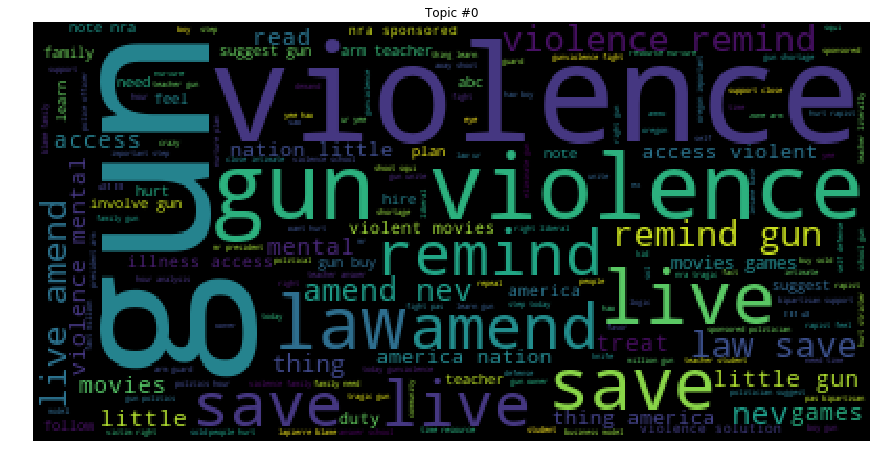

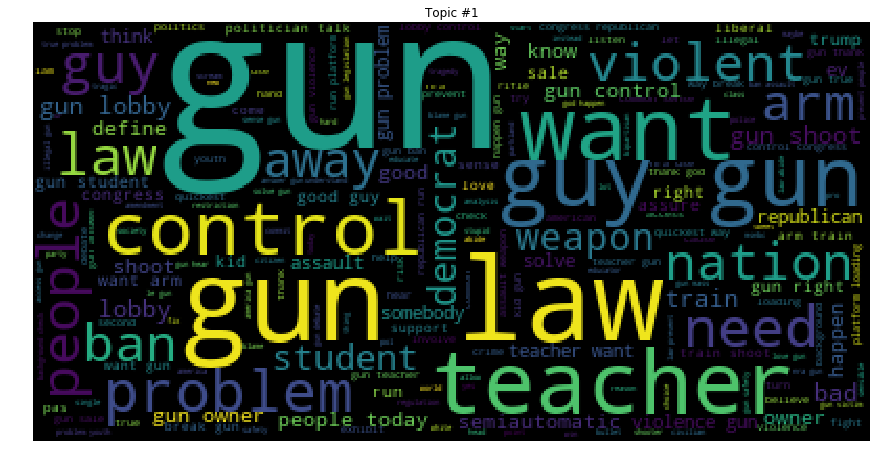

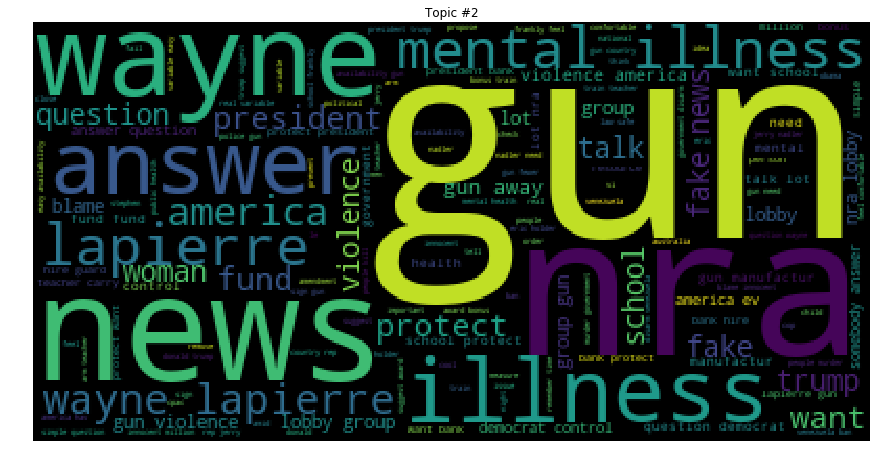

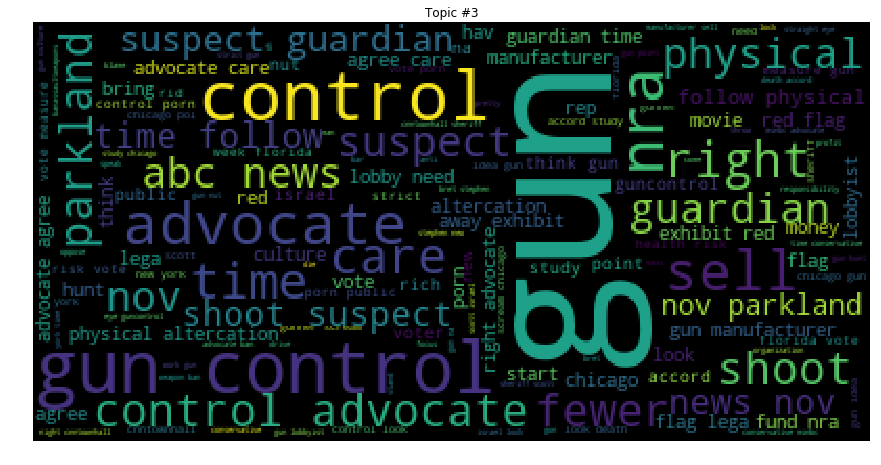

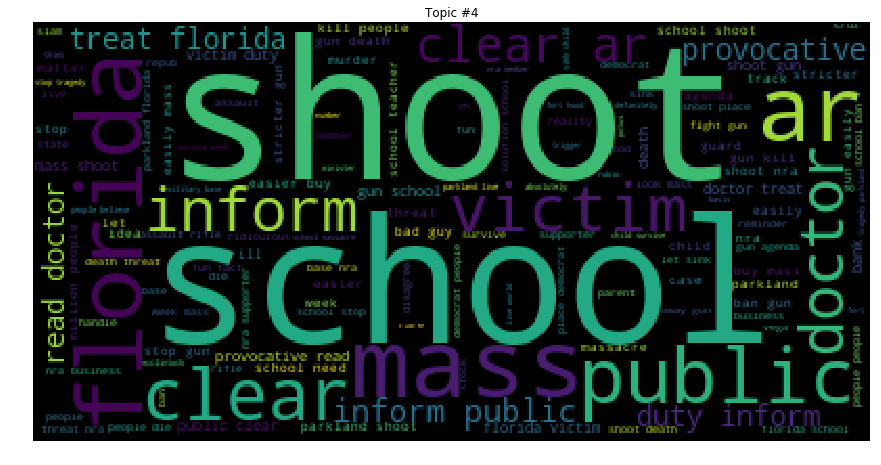

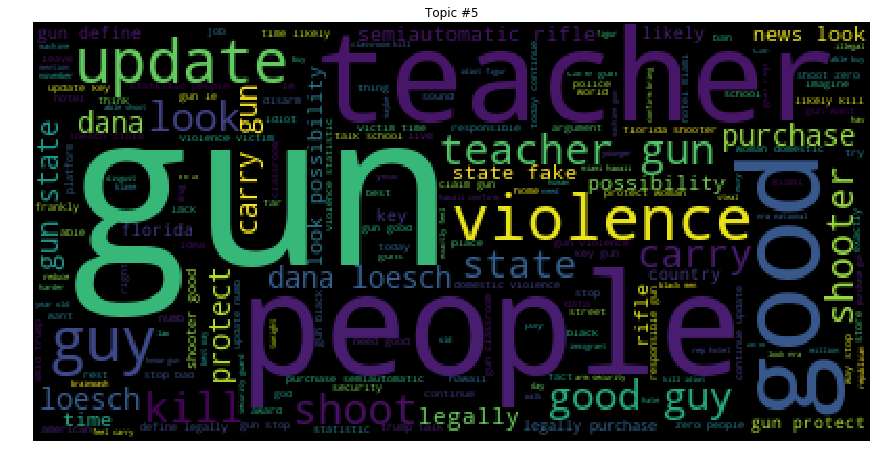

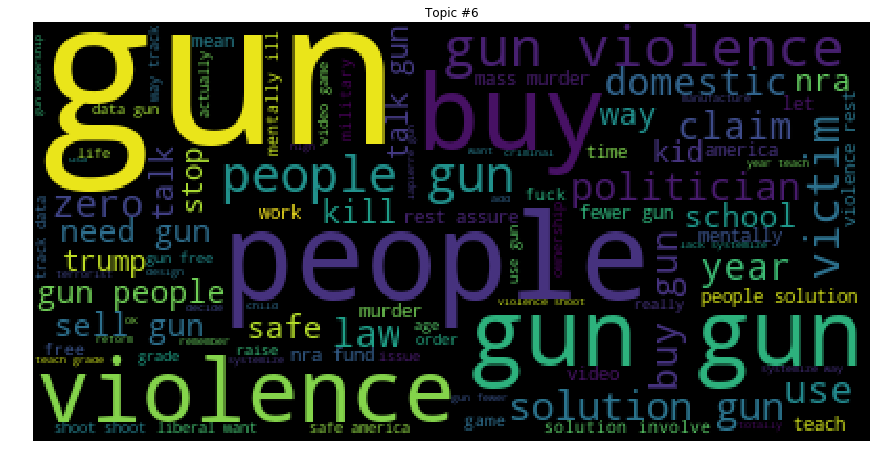

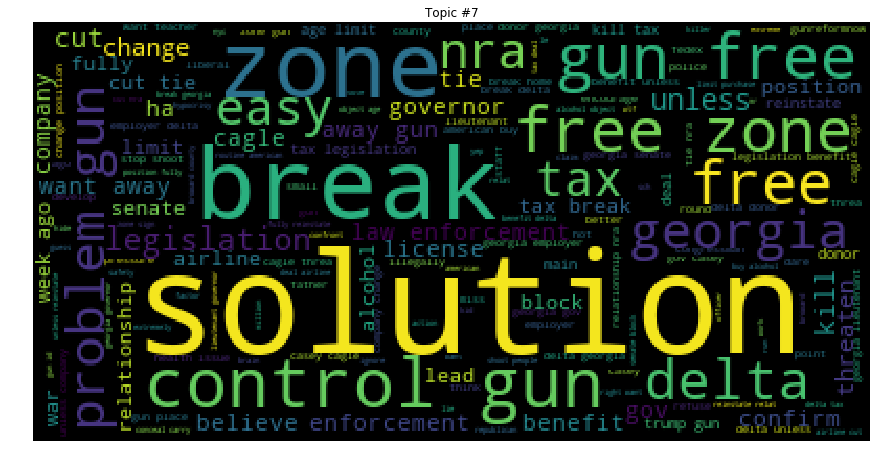

In [64]:
import matplotlib.pyplot as plt
for t in range(lda.num_topics):
    
    plt.figure(figsize=(15,10) )
    
    plt.imshow(WordCloud().fit_words(dict(lda.show_topic(t, 200))))
    plt.axis("off")
    plt.title("Topic #" + str(t))
    plt.show()

#### Topic Space

In [66]:
# Map documents to topic space 
#Transform the docs from word space to the topic space
lda_corpus = lda[corpus]
lda_corpus

In [70]:
#This will determine the proportion of topics in each tweet
lda_docs = [doc for doc in lda_corpus]

In [74]:
tweet_cln[0:5]

['25 year ago terrorist attack world trade center first time nra become responsible fo…',
 'sorry nra become protect class last check lobby organization private company delta right cut tie fun unemployment line election come',
 'parkland shoot survivor rip nra dana loesch',
 'nra gop accustom gun massacre fade news cycle short order rely ephemeralit…',
 'prime member 5 year ask keep relationship nra resignisrael obamagate']

In [71]:
lda_docs

[[(2, 0.0599422), (6, 0.27075234), (7, 0.6408655)],
 [(0, 0.035238042),
  (1, 0.21886371),
  (4, 0.1029285),
  (5, 0.09135891),
  (6, 0.03240308),
  (7, 0.5122485)],
 [(1, 0.08496312), (4, 0.5543971), (5, 0.31597742)],
 [(2, 0.054924846), (6, 0.9138155)],
 [(2, 0.38262865), (7, 0.5704117)],
 [(2, 0.28379533), (3, 0.09904859), (6, 0.18727069), (7, 0.39414257)],
 [(0, 0.94526416)],
 [(6, 0.95132214)],
 [(7, 0.9602271)],
 [(2, 0.6788681), (3, 0.24608755)],
 [(4, 0.9602222)],
 [(2, 0.95621365)],
 [(0, 0.9007159), (4, 0.045712683)],
 [(3, 0.9124819)],
 [(0, 0.9270317)],
 [(3, 0.3004495), (7, 0.6620438)],
 [(2, 0.11681106), (3, 0.83621764)],
 [(2, 0.95624447)],
 [(4, 0.9374865)],
 [(0, 0.06478373), (1, 0.6639773), (5, 0.2428012)],
 [(7, 0.9513885)],
 [(1, 0.9513824)],
 [(3, 0.098978005), (7, 0.8634443)],
 [(0, 0.17113231), (3, 0.33418587), (4, 0.22624815), (5, 0.21835157)],
 [(3, 0.055455152), (6, 0.07382197), (7, 0.84667027)],
 [(0, 0.032180913),
  (2, 0.032956105),
  (3, 0.136017),
  (4, 0

### LSA

In [75]:
tweet_str

"25 year ago terrorist attack world trade center first time nra become responsible fo…,sorry nra become protect class last check lobby organization private company delta right cut tie fun unemployment line election come,parkland shoot survivor rip nra dana loesch,nra gop accustom gun massacre fade news cycle short order rely ephemeralit…,prime member 5 year ask keep relationship nra resignisrael obamagate,join nra piss liberal 30.00 year 100 5 year 🇱🇷 maga,nra go anywhere pull ad attack member cry heart desire suspend my…,today tallahassee deliver thousand petition receive last day gun reform s…,delta one georgia top employer delta one top donor georgia gov casey cagle cagle threa…,coward israel stand failure firescottisrael,let sink child survive last week mass shoot death threat nra supporter…,kid worry suspend protest gun violence ruin college prospect promise…,two 4 plan easily hijack 9/11 plan unite sue oblivion they…,end partnership nra neveragain boycottnra,nothing else whole bu

In [99]:
vectorizer = CountVectorizer(min_df = 1000, stop_words = 'english')
dtm = vectorizer.fit_transform(tweet_cln)

In [102]:

pd.DataFrame(dtm.toarray(),index=tweet_cln,columns=vectorizer.get_feature_names()).head(10)

,15,2nd,access,amend,amendment,america,american,answer,ar,arm,assault,away,bad,ban,benefit,blame,boycott,break,buy,child,clear,come,company,continue,control,cut,dana,death,delta,democrat,discount,doctor,duty,fedex,florida,free,georgia,good,gov,government,governor,gun,guy,inform,kid,kill,know,lapierre,law,legislation,let,liberal,little,live,lobby,look,mass,member,mental,million,money,need,nev,news,nra,parkland,people,political,politician,prevent,problem,protect,provocative,public,read,remind,rifle,right,save,school,shoot,shooter,solution,stand,state,stop,student,support,talk,tax,teacher,thing,think,threat,threaten,tie,time,today,treat,trump,try,unless,use,victim,violence,violent,want,way,wayne,weapon,week,work,year
25 year ago terrorist attack world trade center first time nra become responsible fo…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
sorry nra become protect class last check lobby organization private company delta right cut tie fun unemployment line election come,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
parkland shoot survivor rip nra dana loesch,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
nra gop accustom gun massacre fade news cycle short order rely ephemeralit…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
prime member 5 year ask keep relationship nra resignisrael obamagate,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
join nra piss liberal 30.00 year 100 5 year 🇱🇷 maga,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
nra go anywhere pull ad attack member cry heart desire suspend my…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
today tallahassee deliver thousand petition receive last day gun reform s…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
delta one georgia top employer delta one top donor georgia gov casey cagle cagle threa…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
coward israel stand failure firescottisrael,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [103]:
vectorizer.get_feature_names()

['15',
 '2nd',
 'access',
 'amend',
 'amendment',
 'america',
 'american',
 'answer',
 'ar',
 'arm',
 'assault',
 'away',
 'bad',
 'ban',
 'benefit',
 'blame',
 'boycott',
 'break',
 'buy',
 'child',
 'clear',
 'come',
 'company',
 'continue',
 'control',
 'cut',
 'dana',
 'death',
 'delta',
 'democrat',
 'discount',
 'doctor',
 'duty',
 'fedex',
 'florida',
 'free',
 'georgia',
 'good',
 'gov',
 'government',
 'governor',
 'gun',
 'guy',
 'inform',
 'kid',
 'kill',
 'know',
 'lapierre',
 'law',
 'legislation',
 'let',
 'liberal',
 'little',
 'live',
 'lobby',
 'look',
 'mass',
 'member',
 'mental',
 'million',
 'money',
 'need',
 'nev',
 'news',
 'nra',
 'parkland',
 'people',
 'political',
 'politician',
 'prevent',
 'problem',
 'protect',
 'provocative',
 'public',
 'read',
 'remind',
 'rifle',
 'right',
 'save',
 'school',
 'shoot',
 'shooter',
 'solution',
 'stand',
 'state',
 'stop',
 'student',
 'support',
 'talk',
 'tax',
 'teacher',
 'thing',
 'think',
 'threat',
 'threaten',


In [119]:
## Fit LSA
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import Normalizer
lsa = TruncatedSVD(n_components=100,algorithm='randomized')
dtm_lsa = lsa.fit_transform(dtm)
dtm_lsa = Normalizer(copy=False).fit_transform(dtm_lsa)

In [120]:
# The ratio between the varaince of the principal component and total variance
lsa.explained_variance_ratio_

array([0.18056913, 0.07054665, 0.05243577, 0.04752885, 0.03624733,
       0.03098449, 0.02728247, 0.02352639, 0.02259016, 0.02070129,
       0.01847058, 0.01703508, 0.01533412, 0.01407007, 0.01314521,
       0.01250536, 0.01221916, 0.01181508, 0.0114562 , 0.01058372,
       0.01036214, 0.00987118, 0.00938249, 0.00881531, 0.00849571,
       0.0082869 , 0.00793146, 0.00769733, 0.00759999, 0.00748569,
       0.0073179 , 0.00722512, 0.00715483, 0.00697838, 0.00685711,
       0.00679088, 0.0066968 , 0.00654225, 0.00629794, 0.00607494,
       0.00599249, 0.00576512, 0.00571322, 0.00557722, 0.00557321,
       0.00547506, 0.00521927, 0.00519914, 0.00499457, 0.00489423,
       0.00480986, 0.00473625, 0.00463697, 0.0044501 , 0.00433924,
       0.00431274, 0.00425657, 0.00407263, 0.00402512, 0.0039018 ,
       0.00383902, 0.00381493, 0.00372836, 0.00360476, 0.00358311,
       0.00355117, 0.00348055, 0.00337328, 0.00333479, 0.00328093,
       0.00317062, 0.00312179, 0.00306402, 0.0029787 , 0.00277

In [121]:
pd.DataFrame(lsa.components_.round(5),columns = vectorizer.get_feature_names())

,15,2nd,access,amend,amendment,america,american,answer,ar,arm,assault,away,bad,ban,benefit,blame,boycott,break,buy,child,clear,come,company,continue,control,cut,dana,death,delta,democrat,discount,doctor,duty,fedex,florida,free,georgia,good,gov,government,governor,gun,guy,inform,kid,kill,know,lapierre,law,legislation,let,liberal,little,live,lobby,look,mass,member,mental,million,money,need,nev,news,nra,parkland,people,political,politician,prevent,problem,protect,provocative,public,read,remind,rifle,right,save,school,shoot,shooter,solution,stand,state,stop,student,support,talk,tax,teacher,thing,think,threat,threaten,tie,time,today,treat,trump,try,unless,use,victim,violence,violent,want,way,wayne,weapon,week,work,year
0,0.00535,0.05015,0.01506,0.04414,0.00699,0.03481,0.01046,0.02186,0.00673,0.03251,0.00899,0.02191,0.02342,0.02749,0.00120,0.01094,0.00231,0.00675,0.03023,0.01391,0.00230,0.01010,0.00318,0.01462,0.05833,0.00269,0.00952,0.01562,0.00528,0.01307,0.00252,0.00119,0.00118,0.00452,0.01381,0.01863,0.00322,0.03728,0.00141,0.00485,0.00133,0.94208,0.05042,0.00123,0.02433,0.03327,0.01937,0.01456,0.08941,0.00317,0.01874,0.01128,0.01138,0.05460,0.02118,0.01633,0.02186,0.00911,0.01736,0.00978,0.00802,0.04240,0.04374,0.00930,0.10592,0.00616,0.10569,0.00506,0.01585,0.00717,0.02666,0.01829,0.00074,0.00554,0.00286,0.04431,0.01274,0.03233,0.04683,0.06208,0.07658,0.01428,0.03012,0.00460,0.01615,0.03171,0.01835,0.01091,0.02168,0.00415,0.07739,0.01912,0.02500,0.00417,0.00185,0.00191,0.02179,0.01703,0.00210,0.02430,0.01257,0.00317,0.02352,0.01114,0.13375,0.01188,0.04946,0.02435,0.01552,0.01456,0.00708,0.01252,0.01552
1,0.00585,-0.02586,-0.00705,-0.03373,0.01170,-0.00607,0.01110,-0.00643,0.00551,0.01218,0.00777,0.00302,0.00202,-0.00232,0.01953,0.01169,0.05174,0.06116,0.01204,0.04449,0.00605,0.01085,0.04681,0.00622,-0.00973,0.05793,0.00979,0.04125,0.15215,0.00036,0.06353,0.00265,0.00315,0.09515,0.01122,0.00804,0.11111,-0.00169,0.02849,0.00530,0.04058,-0.11575,-0.00535,0.00278,0.01654,0.03523,0.01612,0.00662,-0.01088,0.02228,0.05745,0.02203,-0.00179,-0.03230,0.05653,0.00761,0.05786,0.11767,-0.00559,0.04347,0.02937,0.01661,-0.03399,0.00422,0.92067,0.01578,0.00323,0.02694,0.01345,0.00449,-0.00398,0.00566,0.00270,0.00503,0.00427,-0.03339,0.00414,0.03443,-0.03143,0.01487,0.07874,-0.00130,0.00095,0.03709,0.02063,0.01468,0.00443,0.04288,0.03442,0.08224,-0.00784,-0.00137,0.02254,0.04453,0.02889,0.05828,0.02122,0.00337,0.00325,0.02396,0.01590,0.02746,0.02323,0.00233,-0.04864,-0.00551,0.01083,0.00774,0.00567,0.00501,0.03966,0.00318,0.00969
2,0.29202,-0.02673,-0.00205,-0.02588,0.00049,-0.00380,0.00081,0.00005,0.29495,0.00171,0.00620,0.00074,0.00251,0.00282,-0.00004,0.00014,-0.00179,-0.00320,0.00020,0.00111,0.28395,0.00037,-0.00071,-0.00128,0.01036,-0.00175,0.01074,0.00203,-0.00710,-0.00058,-0.00166,0.27891,0.27880,-0.00248,0.31011,-0.00021,-0.00488,0.01992,-0.00154,0.00060,-0.00169,-0.00770,0.02117,0.27883,0.00474,0.01319,0.00071,-0.00059,-0.03125,-0.00028,0.00552,0.00369,-0.00191,-0.02316,-0.00272,0.00031,0.00082,-0.00294,-0.00224,-0.00189,-0.00077,0.00174,-0.02578,0.00051,-0.02546,0.00330,0.00128,-0.00099,-0.00229,0.00106,-0.00011,0.01432,0.27735,0.29152,0.28197,-0.02591,0.01917,0.00568,-0.02597,0.01846,0.01019,0.01434,-0.00226,0.00358,0.00056,0.00185,0.00166,0.00087,-0.00197,-0.00237,0.00324,-0.00185,0.00150,0.00162,-0.00111,-0.00175,0.01196,-0.00072,0.28095,0.00097,0.00121,-0.00077,0.00086,0.29634,-0.02518,-0.00212,0.01221,-0.00015,-0.00060,0.00234,0.00912,0.00002,-0.00006
3,0.02280,0.32460,0.01312,0.30843,0.00516,0.01454,-0.00721,-0.01336,0.02125,-0.05853,-0.00961,-0.02315,-0.03846,-0.03071,0.00637,-0.00728,0.00595,0.01353,-0.02578,-0.02388,0.02807,-0.00857,0.00699,-0.01059,-0.05357,0.01355,0.01429,-0.02529,0.05039,-0.00199,0.01021,0.02576,0.02583,0.01407,0.00674,-0.02027,0.04207,-0.07224,0.01130,-0.00541,0.01294,-0.10561,-0.09578,0.02585,-0.03030,-0.00879,-0.01905,-0.00350,0.35416,0.00578,-0.02312,-0.00509,0.01632,0.32115,-0.00682,-0.02742,-0.04225

In [117]:
#Each document is a linear combination of the LSA components
np.array(vectorizer.get_feature_names())

array(['15', '2nd', 'access', 'amend', 'amendment', 'america', 'american',
       'answer', 'ar', 'arm', 'assault', 'away', 'bad', 'ban', 'benefit',
       'blame', 'boycott', 'break', 'buy', 'child', 'clear', 'come',
       'company', 'continue', 'control', 'cut', 'dana', 'death', 'delta',
       'democrat', 'discount', 'doctor', 'duty', 'fedex', 'florida',
       'free', 'georgia', 'good', 'gov', 'government', 'governor', 'gun',
       'guy', 'inform', 'kid', 'kill', 'know', 'lapierre', 'law',
       'legislation', 'let', 'liberal', 'little', 'live', 'lobby', 'look',
       'mass', 'member', 'mental', 'million', 'money', 'need', 'nev',
       'news', 'nra', 'parkland', 'people', 'political', 'politician',
       'prevent', 'problem', 'protect', 'provocative', 'public', 'read',
       'remind', 'rifle', 'right', 'save', 'school', 'shoot', 'shooter',
       'solution', 'stand', 'state', 'stop', 'student', 'support', 'talk',
       'tax', 'teacher', 'thing', 'think', 'threat', 'threaten

In [118]:
pd.DataFrame(dtm_lsa.round(5),index=tweet_cln)

KeyboardInterrupt: 

In [122]:
[[tweet_cln[i], dtm_lsa[i][0].round(5), dtm_lsa[i][1].round(5)] for i in range(len(tweet_cln))]

[['25 year ago terrorist attack world trade center first time nra become responsible fo…',
  0.08272,
  0.54956],
 ['sorry nra become protect class last check lobby organization private company delta right cut tie fun unemployment line election come',
  0.06697,
  0.44782],
 ['parkland shoot survivor rip nra dana loesch', 0.09915, 0.51276],
 ['nra gop accustom gun massacre fade news cycle short order rely ephemeralit…',
  0.6105,
  0.4672],
 ['prime member 5 year ask keep relationship nra resignisrael obamagate',
  0.07541,
  0.60534],
 ['join nra piss liberal 30.00 year 100 5 year 🇱🇷 maga', 0.06059, 0.39321],
 ['nra go anywhere pull ad attack member cry heart desire suspend my…',
  0.08135,
  0.73428],
 ['today tallahassee deliver thousand petition receive last day gun reform s…',
  0.67825,
  -0.07948],
 ['delta one georgia top employer delta one top donor georgia gov casey cagle cagle threa…',
  0.00614,
  0.185],
 ['coward israel stand failure firescottisrael', 0.00462, 0.03725],
 

In [126]:
xs = [w[0].round(5) for w in dtm_lsa] 
ys = [w[1].round(5) for w in dtm_lsa]
c_[xs, ys]

array([[ 0.08272,  0.54956],
       [ 0.06697,  0.44782],
       [ 0.09915,  0.51276],
       ...,
       [ 0.86   , -0.09066],
       [ 0.778  , -0.08579],
       [ 0.69027, -0.13906]])

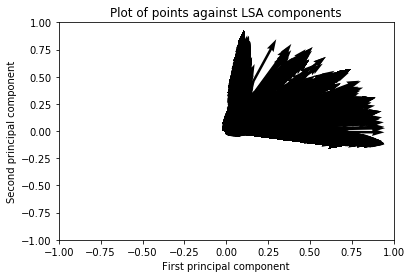

In [127]:
plt.figure()
ax = plt.gca()
ax.quiver(0,0,xs,ys,angles='xy',scale_units='xy',scale=1, linewidth = .01) 
# ax.quiver(0,0,xs,ys,scale=1, linewidth = .01)
ax.set_xlim([-1,1])
ax.set_ylim([-1,1])
xlabel('First principal component')
ylabel('Second principal component')
title('Plot of points against LSA components')
plt.draw()
plt.show()

In [130]:
similarity = np.asarray(numpy.asmatrix(dtm_lsa) * numpy.asmatrix(dtm_lsa).T) 

KeyboardInterrupt: 

#### Count Vectorizer

In [137]:
#Regular count of words (bag of words)
from sklearn.feature_extraction.text import CountVectorizer

vec = CountVectorizer()
matrix_ct = vec.fit_transform(tweet_cln)
#pd.DataFrame(matrix.toarray(), columns=vec.get_feature_names())

#### TFID Vectorizer

In [55]:
#percentage of the words in a sentence - usually used to compare sentences of different length 
#your name in a tweet vs. your name in a book
from sklearn.feature_extraction.text import TfidfVectorizer

vec = TfidfVectorizer(min_df=1000,use_idf=True,ngram_range=(1,2))
matrix_tfid = vec.fit_transform(tweet_cln)
#Inverse document frequency

idf_df = pd.DataFrame(matrix_tfid.toarray(), columns=vec.get_feature_names())

In [56]:
km = KMeans(n_clusters=10)
km.fit(idf_df[['nra', 'gun']])

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [57]:
idf_df['category'] = km.labels_
idf_df.head()

,15,2nd,2nd amend,access,also,amend,amend nev,amendment,america,american,answer,ar,ar 15,arm,assault,away,bad,ban,benefit,blame,boycott,break,buy,call,child,clear,clear ar,come,company,continue,control,cut,dana,death,delta,democrat,discount,doctor,doctor treat,duty,duty inform,even,fedex,florida,florida victim,free,georgia,give,go,good,good guy,gov,government,governor,gun,gun control,gun law,gun violence,guy,guy gun,inform,inform public,keep,kid,kill,know,lapierre,last,law,law save,legislation,let,liberal,little,live,live 2nd,lobby,look,mass,mass shoot,member,mental,million,money,need,nev,never,news,nothing,nothing gun,nra,nra member,one,parkland,people,political,politician,prevent,problem,protect,provocative,provocative read,public,public clear,read,read doctor,remind,remind gun,rifle,right,save,save live,school,see,shoot,shooter,solution,someone,someone nothing,stand,state,stop,student,support,take,talk,tax,teacher,teacher gun,thing,think,threat,threaten,tie,time,today,treat,treat florida,trump,try,unless,use,victim,victim duty,violence,violence remind,violent,want,way,wayne,wayne lapierre,weapon,week,work,year,category
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.324145,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.616866,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.717222,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.370537,0.320474,0.0,0.0,0.33728,0.000000,0.0,0.279852,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.3458,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.32312,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.159503,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.330641,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.304669,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.341104,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00000,0.629185,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.272451,0.0,0.0,0.594654,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.419862,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.313562,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.863228,0.0,0.0,0.395622,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,3


Text(0,0.5,'Gun')

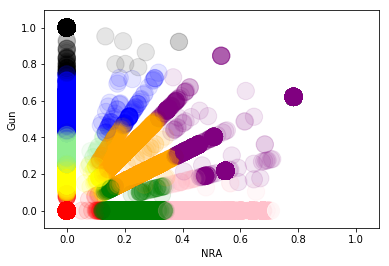

In [58]:
# Build our color map
colormap = { 0: 'red', 1: 'green', 2: 'blue',3: 'purple',4: 'yellow',5: 'black',6: 'white',7: 'orange'
           , 8: 'pink', 9: 'lightgreen'}
colors = idf_df.apply(lambda row: colormap[row.category], axis=1)

# Plot our scatter
ax = idf_df.plot(kind='scatter', x='nra', y='gun', alpha=0.1, s=300, c=colors)
ax.set_xlabel("NRA")
ax.set_ylabel("Gun")

In [54]:
print("Top terms per cluster:")
order_centroids = km.cluster_centers_.argsort()[:, ::-1]
terms = vec.get_feature_names()
for i in range(10):
    top_ten_words = [terms[ind] for ind in order_centroids[i, :5]]
    print("Cluster {}: {}".format(i, ' '.join(top_ten_words)))

Top terms per cluster:
Cluster 0: 2nd 15
Cluster 1: 15 2nd
Cluster 2: 15 2nd
Cluster 3: 15 2nd
Cluster 4: 2nd 15
Cluster 5: 15 2nd
Cluster 6: 2nd 15
Cluster 7: 2nd 15
Cluster 8: 15 2nd
Cluster 9: 2nd 15


In [62]:
order_centroids

array([[ 23,  64,  93, ...,  37, 136,   0],
       [ 54, 144,  57, ..., 145, 103, 137],
       [127,  54, 128, ..., 143,  26,  85],
       ...,
       [ 69, 145, 118, ..., 112, 113,   0],
       [ 90,  42,  80, ...,   2, 118,  85],
       [147,  54,  99, ...,  50,  26,  85]])

In [50]:
order_centroids[0, :5]
terms[9]

'american'

In [59]:
# from sklearn.cluster import KMeans


km = KMeans(n_clusters=10)
# Normally people fit the matrix
km.fit(matrix_tfid)
# But you could fit the idf_df instead
# km.fit        

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [61]:
print("Top terms per cluster:")
order_centroids = km.cluster_centers_.argsort()[:, ::-1]
terms = vec.get_feature_names()
for i in range(10):
    top_ten_words = [terms[ind] for ind in order_centroids[i, :5]]
    print("Cluster {}: {}".format(i, ' '.join(top_ten_words)))

Top terms per cluster:
Cluster 0: call kill parkland news time
Cluster 1: gun violence gun violence people control
Cluster 2: teacher gun teacher gun arm give
Cluster 3: georgia delta tax break governor
Cluster 4: guy good guy gun good guy gun
Cluster 5: mass mass shoot shoot threat death
Cluster 6: gun people support school wayne
Cluster 7: law save violence remind someone nothing live 2nd 2nd amend
Cluster 8: nra fedex member discount nra member
Cluster 9: want gun protect shoot teacher


In [ ]:
# Assign the category to the dataframe
df['category'] = km.labels_

In [140]:
pd.DataF   rame(matrix_tfid.toarray(), columns=vec.get_feature_names())

KeyboardInterrupt: 

### KMeans Clustering

In [131]:
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA, KernelPCA
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans, SpectralClustering, DBSCAN, Birch, AgglomerativeClustering

In [ ]:
kmeans2 = KMeans(n_clusters=2)
kmeans8 = KMeans(n_clusters=8)
kmeans_models = [kmeans2, kmeans8]
pca_components = list(np.arange(2,13,2))
silho_scores = []

In [ ]:
for model in kmeans_models:
    for n_component in pca_components:
        pca = PCA(n_component)
        X_new = pca.fit_transform(orbits_frame.as_matrix())
        labels = model.fit_predict(X_new)
        silho_scores.append(silhouette_score(X_new, labels, random_state=0))

In [136]:
pca = PCA(100)
X_new = pca.fit_transform(tweet_str.as_matrix())

AttributeError: 'str' object has no attribute 'as_matrix'

In [132]:
km = KMeans(n_clusters=10)

### Import tweets in dataframe

In [128]:
stop

{'!',
 '"',
 '#',
 "'",
 '(',
 ')',
 ',',
 '.',
 ':',
 '?',
 '`',
 'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'amp',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'l',
 'like',
 'll',
 'lt',
 'm',
 'ma',
 'make',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'o

height has been deprecated.



In [89]:
results

[Status(_api=<tweepy.api.API object at 0x116d37d30>, _json={'created_at': 'Mon Feb 26 23:59:59 +0000 2018', 'id': 968274478194184192, 'id_str': '968274478194184192', 'full_text': 'RT @sean_spicier: 25 years ago terrorists attacked the World Trade Center for the first time. This was before the NRA became responsible fo…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'sean_spicier', 'name': 'Sean Spicier', 'id': 821511862881845248, 'id_str': '821511862881845248', 'indices': [3, 16]}], 'urls': []}, 'metadata': {'iso_language_code': 'en', 'result_type': 'recent'}, 'source': '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 374096782, 'id_str': '374096782', 'name': 'KatiBarTheDoor', 'screen_name':

In [203]:
import preprocessor as p
p.set_options(p.OPT.URL, p.OPT.EMOJI,p.OPT.SMILEY,p.OPT.RESERVED,p.OPT.MENTION)
lmtzr = WordNetLemmatizer()
def structure_results(results):
    id_list=[tweet.id for tweet in results]
   
    data=pd.DataFrame(id_list,columns=['id'])
    
###Clean text of the tweets
    data["text"]= [tweet.full_text.encode('utf-8') for tweet in results]
    data["text1"]= [p.clean(tweet.full_text) for tweet in results]
    #Escaping HTML Char
    data["text1"] = html_parser.unescape(data['text1'])
    data['text2'] = data['text1']
    data['polarity'] = [TextBlob(str(x)).sentiment[0] for x in data['text1']]
    data['sentiment'] = [TextBlob(str(x)).sentiment[1] for x in data['text1']]
    
#     # Decoding Data
    for ind,i in enumerate(data['text1']):
        
#         data['text1'][ind] = i.decode('utf-8').encode('ascii','ignore')
#     #Search for apostrophe and retrieve the full words
        data['text1'][ind] = decontracted(str(data['text1'][ind]))
#         data['sentiment'][ind] = TextBlob(str(data['text2'][ind])).sentiment[0]
#     #Remove Stop Words
       
        data['text1'][ind] = TextBlob(data['text1'][ind].lower()).words
        
        data['text1'][ind] = [lmtzr.lemmatize(lmtzr.lemmatize(w,pos="v"),pos='n') for w in data['text1'][ind] if w not in stop]
        data['text1'][ind] = ' '.join(data['text1'][ind])
        


    data["datetime"]=[tweet.created_at for tweet in results]
    data["Place"]=[tweet.place for tweet in results]
    data['UserLoc']=[tweet.user.location for tweet in results]
    data["Hashtags"]=[tweet.entities['hashtags'] for tweet in results]
 
    for ind,i in enumerate(data['Hashtags']):

        if i != []:
            mylist = i
            myvalues = [i['text'] for i in mylist if 'text' in i]
#             hashtags.append(myvalues)
#             data['Hashtags1'] = myvalues
#             print(myvalues)
        else:
            myvalues = ''

        data['Hashtags'][ind] = myvalues
    data["retweet_ct"]=[tweet.retweet_count for tweet in results]
    data["favorite_ct"]=[tweet.favorite_count for tweet in results]

    
    return data

In [201]:
#  for w in data['text1']:
a = ''.join(df['text1'][0])
TextBlob(df['text1'][0]).sentiment[1]

0.3277777777777778

In [129]:


id_list=[tweet.id for tweet in results]
   
data=pd.DataFrame(id_list,columns=['id'])
data["text"]= [tweet.full_text.encode('utf-8') for tweet in results]
data["text1"]= [tweet.full_text.encode('utf-8') for tweet in results]
#data['text'] = data['text'].decode('utf-8').encode('ascii','ignore')
for ind,i in enumerate(data['text']):
#     tweet = i.decode('utf-8').encode('ascii','ignore')
    data['text'][ind] = i.decode('utf-8').encode('ascii','ignore')
    data['text'][ind] = decontracted(str(data['text'][ind]))
    data['text1'][ind] = TextBlob(data['text'][ind]).words
    data['text1'][ind] = [w for w in data['text1'][ind] if w not in stop]
    


#     data['text'][ind] = [w for w in data['text'][ind] if w not in stop]
    


/Users/jennifer/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()
/Users/jennifer/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':
/Users/jennifer/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]
/Users/jennifer/an

In [192]:
results[0]

Status(_json={'created_at': 'Mon Feb 26 23:59:59 +0000 2018', 'id': 968274478194184192, 'id_str': '968274478194184192', 'full_text': 'RT @sean_spicier: 25 years ago terrorists attacked the World Trade Center for the first time. This was before the NRA became responsible fo…', 'truncated': False, 'display_text_range': [0, 140], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'sean_spicier', 'name': 'Sean Spicier', 'id': 821511862881845248, 'id_str': '821511862881845248', 'indices': [3, 16]}], 'urls': []}, 'metadata': {'iso_language_code': 'en', 'result_type': 'recent'}, 'source': '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 374096782, 'id_str': '374096782', 'name': 'KatiBarTheDoor', 'screen_name': 'k80krickt', 'location': 'Marlow, OK`', 'desc

In [204]:
df = structure_results(results[0:5])

/Users/jennifer/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: DeprecationWarning: The unescape method is deprecated and will be removed in 3.5, use html.unescape() instead.
  del sys.path[0]
/Users/jennifer/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/jennifer/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/jennifer/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the document

In [205]:
df

,id,text,text1,text2,polarity,sentiment,datetime,Place,UserLoc,Hashtags,retweet_ct,favorite_ct
0,968274478194184192,b'RT @sean_spicier: 25 years ago terrorists attacked the World Trade Center for the first time. This was before the NRA became responsible fo\xe2\x80\xa6',25 year ago terrorist attack world trade center first time nra become responsible fo…,: 25 years ago terrorists attacked the World Trade Center for the first time. This was before the NRA became responsible fo…,0.116667,0.327778,2018-02-26 23:59:59,None,"Marlow, OK`",,506,0
1,968274478143741952,b'@CaseyCagle @Delta @NRA Sorry but when did the NRA become a protected class? Because last I checked they are a lobby organization and as a private company Delta has the right to cut ties with them. \n\nHave fun on the unemployment line when your elections come up!',sorry nra become protect class last check lobby organization private company delta right cut tie fun unemployment line election come,Sorry but when did the NRA become a protected class? Because last I checked they are a lobby organization and as a private company Delta has the right to cut ties with them. Have fun on the unemployment line when your elections come up!,0.032143,0.435476,2018-02-26 23:59:59,None,"San Francisco, CA",,0,0
2,968274478068150272,"b""RT @HuffPostPol: Parkland shooting survivor rips into NRA's Dana Loesch https://t.co/6SDQev1VUU""",parkland shoot survivor rip nra dana loesch,: Parkland shooting survivor rips into NRA's Dana Loesch,0.000000,0.000000,2018-02-26 23:59:59,None,none,,119,0
3,968274477908922369,b'RT @peterdaou: The #NRA and #GOP are accustomed to gun massacres fading out of the news cycle in short order. They rely on that ephemeralit\xe2\x80\xa6',nra gop accustom gun massacre fade news cycle short order rely ephemeralit…,: The #NRA and #GOP are accustomed to gun massacres fading out of the news cycle in short order. They rely on that ephemeralit…,0.000000,0.300000,2018-02-26 23:59:59,None,,"[NRA, GOP]",539,0
4,968274477904736257,b'@RennieTiffany @NBCNews @realDonaldTrump Prime member for over 5 years asking you to keep your relationship with NRA #ResignIsrael #ObamaGate',prime member 5 year ask keep relationship nra resignisrael obamagate,Prime member for over 5 years asking you to keep your relationship with NRA #ResignIsrael #ObamaGate,0.000000,0.000000,2018-02-26 23:59:59,None,"Chicago, IL","[ResignIsrael, ObamaGate]",0,0


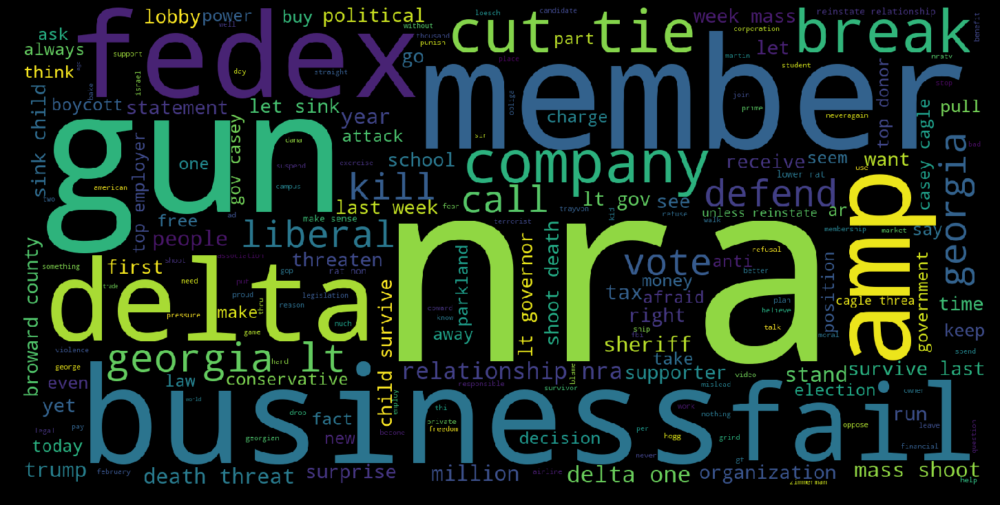

In [174]:
wordcloud = WordCloud(
        
                          background_color='black',
                          width=1600,
                          height=800).generate(' '.join(df['text1']))


plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()





In [50]:
for i in range(6):
    print(p.clean(results[i].full_text))


: 25 years ago terrorists attacked the World Trade Center for the first time. This was before the NRA became responsible fo…
Sorry but when did the NRA become a protected class? Because last I checked they are a lobby organization and as a private company Delta has the right to cut ties with them. Have fun on the unemployment line when your elections come up!
: Parkland shooting survivor rips into NRA's Dana Loesch
: The #NRA and #GOP are accustomed to gun massacres fading out of the news cycle in short order. They rely on that ephemeralit…
Prime member for over 5 years asking you to keep your relationship with NRA #ResignIsrael #ObamaGate
We should all join the NRA just to piss off liberals. It’s $30.00 a year or $100 for 5 years! 🇱🇷#MAGA


In [43]:
import preprocessor as p
p.set_options(p.OPT.URL, p.OPT.EMOJI,p.OPT.SMILEY,p.OPT.RESERVED,p.OPT.MENTION)
p.clean(s)

': 25 years ago terrorists attacked the World Trade Center for the first time. This was before the NRA became responsible fo…'

In [55]:
for ind,i in enumerate(df['text']):
    print(p.clean(i.decode('utf-8')))

: 25 years ago terrorists attacked the World Trade Center for the first time. This was before the NRA became responsible fo…
Sorry but when did the NRA become a protected class? Because last I checked they are a lobby organization and as a private company Delta has the right to cut ties with them. Have fun on the unemployment line when your elections come up!
: Parkland shooting survivor rips into NRA's Dana Loesch
: The #NRA and #GOP are accustomed to gun massacres fading out of the news cycle in short order. They rely on that ephemeralit…
Prime member for over 5 years asking you to keep your relationship with NRA #ResignIsrael #ObamaGate
We should all join the NRA just to piss off liberals. It’s $30.00 a year or $100 for 5 years! 🇱🇷#MAGA
: The NRA isn’t going anywhere — You can pull ads, attack its members and cry to your hearts desire. I’m not suspending my…
: Today in Tallahassee, we delivered thousands of petitions we received in the last few days for gun reform to ’s…
: Delta is 

In [229]:
df['Hashtags']

0    []                                                                           
1    []                                                                           
2    []                                                                           
3    []                                                                           
4    []                                                                           
5    [{'text': 'NRA', 'indices': [63, 67]}]                                       
6    []                                                                           
7    [{'text': 'MEMO', 'indices': [23, 28]}, {'text': 'Gun', 'indices': [69, 73]}]
8    []                                                                           
9    []                                                                           
Name: Hashtags, dtype: object

In [256]:
hashtags=[]
hashlist=[]
for i in df['Hashtags']:
    if i != []:
        mylist = i
        myvalues = [i['text'] for i in mylist if 'text' in i]
        hashtags.append(myvalues)


for i in hashtags:
    for j in i:
        hashlist.append(j)
print(h)

[['NRA'], ['MEMO', 'Gun']]
['NRA', 'MEMO', 'Gun']


In [242]:
import re
re.sub(' ','',str(df['Hashtags'])).split("'text':")[1]                            

"'NRA','indices':[63,67]}]\n6[]\n7[{"

In [ ]:
import re
re.sub(' ','','strip my spaces')

In [117]:
parameters = {"q": "NRA", "count":20}
response = requests.get("https://api.twitter.com/1.1/search/tweets.json",
                        params = parameters,
                        auth=oauth)


from pprint import pprint
pprint(response.json()['search_metadata'])

{'completed_in': 0.058,
 'count': 20,
 'max_id': 968979408274026496,
 'max_id_str': '968979408274026496',
 'next_results': '?max_id=968979404071342079&q=NRA&count=20&include_entities=1',
 'query': 'NRA',
 'refresh_url': '?since_id=968979408274026496&q=NRA&include_entities=1',
 'since_id': 0,
 'since_id_str': '0'}


In [118]:
tweets = response.json()['statuses']

print('PAGE 1')
for tweet in tweets:
    print(tweet['id'], tweet['text'])

PAGE 1
968979408274026496 RT @ChrisMurphyCT: So, wait...Republicans who take tens of thousands of dollars in NRA donations aren't POLITICIZING gun violence, but we a…
968979408122974209 RT @ProudResister: If you don’t think assault weapons play a factor in mass shootings then you either aren’t paying attention or you’re a R…
968979407883862016 RT @RonaldKlain: If you think the NRA-Russia connection is fanciful, here's an NRA statement from 2014 opposing Obama's sanctions on Russia…
968979407862943745 RT @StephenKing: The NRA thinking: "They're just kids. They'll get all excited about their proms or their Facebook walls or something; mayb…
968979407451951105 RT @ROCKONOHIO: Did you ever wonder why Japan never invaded the mainland of America during World War II? The emperor of Japan said, behind…
968979407355432960 RT @CAGOPUnknown: @ConservativeRG @just_old_joe @NRA @NRATV @DLoesch Nope, not a chance.
968979406986366976 @marcorubio You’re a hypocrite! The Terrrorist group, The NRA has b

In [12]:
search_url = "https://api.twitter.com/1.1/search/tweets.json"
next_page_url = search_url + response.json()['search_metadata']['next_results']

response = requests.get(next_page_url, auth=oauth)

print('PAGE 2')
for tweet in response.json()['statuses']:
    print(tweet['text'])

PAGE 2
RT @jchaltiwanger: Cc: @NRA @DLoesch https://t.co/B2rcWvvQ4t
RT @polly: This is the story of how a gun manufacturer sold nearly a million allegedly defective guns, which hurt cops, vets and NRA member…
@LetsGoWVPower No saying the NRA is a lobby for gun manufacturers and many vets arent NRA members at any rate
RT @krassenstein: NRA’s @DLoesch : “We absolutely do not” have responsibility to stop gun deaths

Actually, yes you do. You are an organiza…
@KellyO @realDonaldTrump @BarackObama @realDonaldTrump your  assertions are preposterous  You have a @GOP  problem  funded by the NRA
RT @bbusa617: FED EX Announces They Won’t Cave To Threats From Gun-Control Mob…Left Attacks Them  https://t.co/0OpBBusmti

FED EX REFUSES T…
RT @eugenegu: Thank you Dick's Sporting Goods for refusing to sell assault rifles and raising the minimum age of gun buyers to 21. Let's se…
@jimsciutto @ClarkePanther Yeah right...🙄 Trump will remain SEATED until #Putin, the #Koch’s, or the #NRA *TELL* him what he